In [1]:
import h5py
import warnings

import pandas as pd
import numpy as np
import seaborn as sb
import statsmodels.api as sm
import matplotlib.pyplot as plt

import scipy.cluster.hierarchy as sch
import scipy.spatial.distance as ssd

from scipy.stats import skew, kurtosis
from sklearn.decomposition import PCA
from sklearn.linear_model import LassoLarsCV
from statsmodels import regression
from pykalman import KalmanFilter

DATA CAN BE DOWNLOADED FROM: https://www.dropbox.com/s/dykmvg8j3lzxdcw/data.zip?dl=0

In [2]:
# import dataset
x = h5py.File('./X.h5','r')
y = h5py.File('./Y.h5','r')

# convert to pandas DataFrame
df_x = pd.DataFrame(x['X'][:])
df_y = pd.DataFrame(y['Y'][:])

# rename columns for readability
df_x.columns = ['x'+str(i+1) for i in df_x.columns]
df_y.columns = ['y'+str(i+1) for i in df_y.columns]

## Exploratory analysis on the X dataset

A first look at the data: the last one ('x56') seems to be a 0/1 variable

In [3]:
df_x.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56
0,0.149521,0.274510,0.149521,0.274510,0.067965,0.107871,0.150392,0.081016,0.126149,0.166094,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.109005,0.0
1,0.141983,0.264706,0.141983,0.264706,0.066707,0.105621,0.144824,0.077886,0.120554,0.152308,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.802934,0.0
2,0.134601,0.254902,0.134601,0.254902,0.065451,0.103384,0.139469,0.074768,0.115044,0.139779,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.874133,0.0
3,0.113303,0.225490,0.113303,0.225490,0.061692,0.096754,0.124568,0.071659,0.109615,0.128341,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.135057,0.0
4,0.113303,0.225490,0.113303,0.225490,0.058175,0.091784,0.120647,0.068782,0.105719,0.125670,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.814749,0.0


From raw plots of the 56 X time-series, in different time windows, it can be clearly identified a clustering structure of shapes, made of 6 clusters approximately.

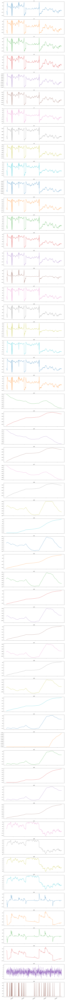

In [14]:
#t1 = 0
#t2 = 1000 #df_x.shape[0]
t2 = df_x.shape[0]
t1 = t2-1000
df_x.loc[t1:t2,:].plot(subplots=True, figsize=(15,5*56), legend=False, title=list(df_x.columns))
plt.show()

The similarity can be confirmed taking a look at the correlation matrix.

In [5]:
df_x_correlation = df_x.corr()
df_x_correlation

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56
x1,1.000000,0.987228,0.981744,0.981849,0.927609,0.943280,0.989798,0.906585,0.916215,0.950220,...,0.043331,0.034362,-0.011307,-0.017126,-0.033941,-0.031586,-0.036862,-0.032753,0.000546,0.004944
x2,0.987228,1.000000,0.973321,0.995933,0.952242,0.965232,0.984104,0.926358,0.933387,0.942682,...,0.053782,0.042754,-0.008030,-0.015202,-0.029408,-0.031267,-0.031974,-0.031965,0.000484,0.004390
x3,0.981744,0.973321,1.000000,0.983529,0.920454,0.934992,0.973896,0.909543,0.918504,0.947160,...,0.046349,0.035092,-0.012132,-0.019046,-0.008794,-0.022064,-0.011547,-0.024195,0.000578,0.003975
x4,0.981849,0.995933,0.983529,1.000000,0.951000,0.963560,0.979757,0.929925,0.936700,0.943940,...,0.055814,0.044049,-0.008211,-0.015835,-0.019523,-0.026782,-0.022112,-0.028102,0.000502,0.003957
x5,0.927609,0.952242,0.920454,0.951000,1.000000,0.998691,0.960762,0.919653,0.921625,0.907904,...,0.138973,0.117941,0.062477,0.050581,-0.057177,-0.068946,-0.055014,-0.059152,0.000501,0.004275
x6,0.943280,0.965232,0.934992,0.963560,0.998691,1.000000,0.972220,0.927916,0.930757,0.921291,...,0.128443,0.108686,0.053117,0.041984,-0.054425,-0.064517,-0.052982,-0.056313,0.000490,0.004380
x7,0.989798,0.984104,0.973896,0.979757,0.960762,0.972220,1.000000,0.924145,0.931976,0.956467,...,0.080947,0.067148,0.017362,0.009730,-0.047157,-0.047649,-0.048290,-0.044971,0.000470,0.005096
x8,0.906585,0.926358,0.909543,0.929925,0.919653,0.927916,0.924145,1.000000,0.999339,0.970305,...,0.162913,0.136482,0.094674,0.084104,-0.063073,-0.076364,-0.062887,-0.073505,0.000071,0.003890
x9,0.916215,0.933387,0.918504,0.936700,0.921625,0.930757,0.931976,0.999339,1.000000,0.977602,...,0.154075,0.128852,0.086485,0.076594,-0.062078,-0.073533,-0.062149,-0.071134,0.000062,0.003830
x10,0.950220,0.942682,0.947160,0.943940,0.907904,0.921291,0.956467,0.970305,0.977602,1.000000,...,0.111098,0.092074,0.052286,0.045937,-0.065520,-0.061676,-0.066430,-0.060623,0.000113,0.003600


A heatmap is suitable to spot cluster in the correlation structure.

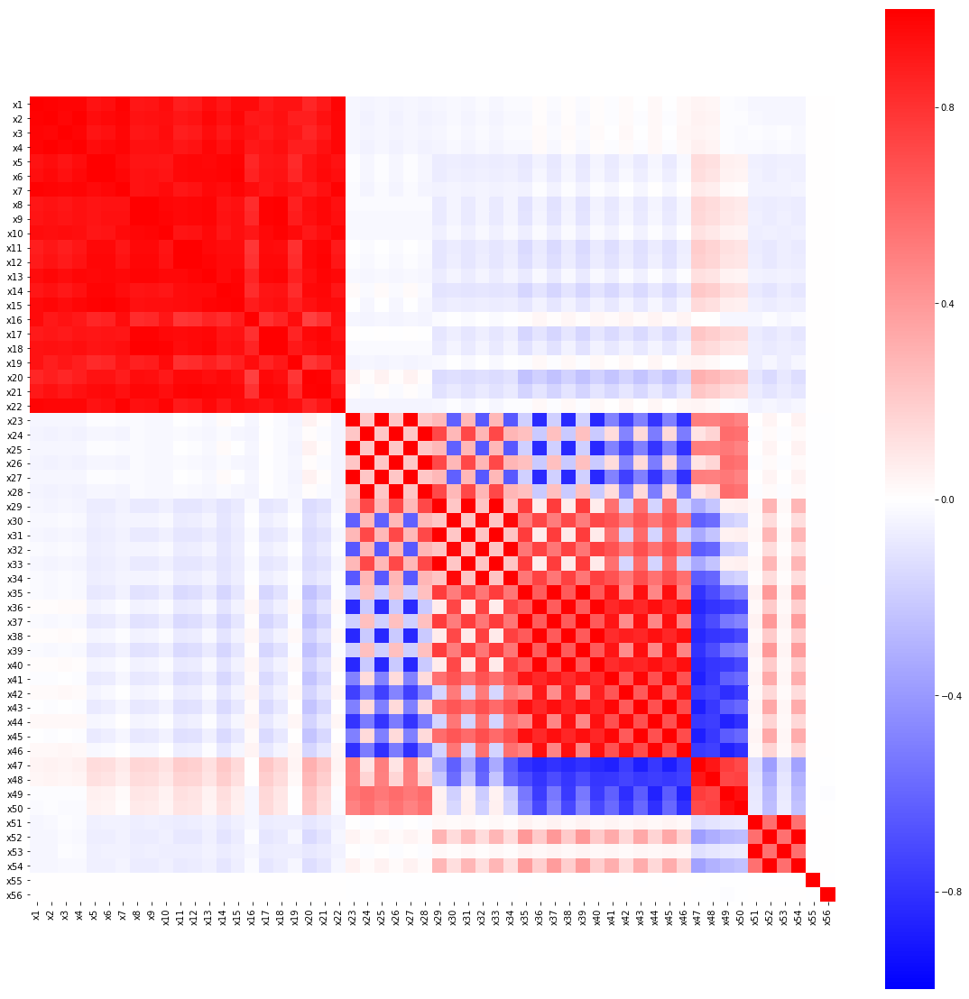

In [9]:
f, ax = plt.subplots(figsize=(20,20))
sb.heatmap(df_x_correlation, vmin=-1.0, vmax=1.0, square=True, cmap='bwr')
plt.show()

As can be seen, there are strong clusters of correlated time series (e.g. x1,...x22). We can employ a clustering approach to group together time-series based on their correlation. Moreover, the last two factors, 'x55' and 'x56' are completely scorrelated from the rest. We leave them out as singleton clusters and analyze the clustering strucuture of {'x1',...,'x54'}

In [7]:
df = df_x.loc[:,:'x54']
df.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54
0,0.149521,0.274510,0.149521,0.274510,0.067965,0.107871,0.150392,0.081016,0.126149,0.166094,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.141983,0.264706,0.141983,0.264706,0.066707,0.105621,0.144824,0.077886,0.120554,0.152308,...,-0.000074,-0.000025,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.134601,0.254902,0.134601,0.254902,0.065451,0.103384,0.139469,0.074768,0.115044,0.139779,...,-0.000220,-0.000073,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.113303,0.225490,0.113303,0.225490,0.061692,0.096754,0.124568,0.071659,0.109615,0.128341,...,-0.000585,-0.000196,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.113303,0.225490,0.113303,0.225490,0.058175,0.091784,0.120647,0.068782,0.105719,0.125670,...,-0.000945,-0.000317,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


We can perfrom a hierarchical clustering of the X dataset to better understand the grouping of the time series in X.

In [4]:
df_corr = df.corr()

In [5]:
d = sch.distance.pdist(df_corr)
Z = sch.linkage(d, 'average')

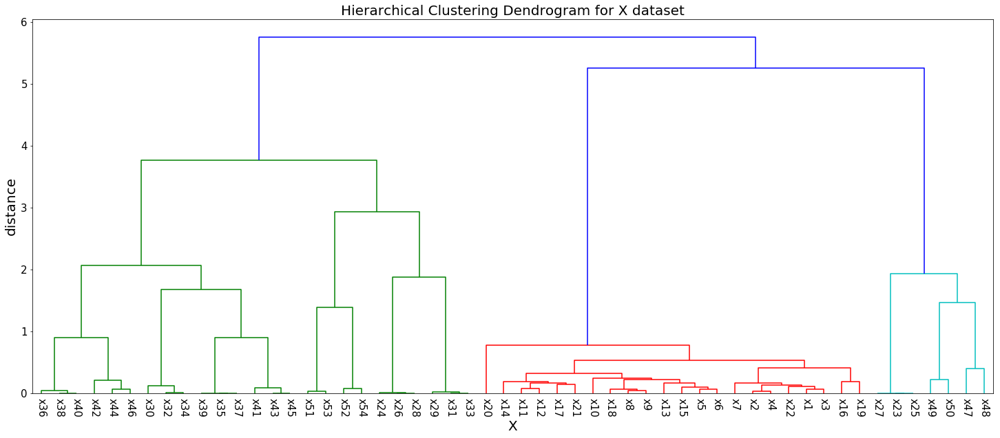

In [8]:
plt.figure(figsize=(25, 10))
labelsize=20
ticksize=15
plt.title('Hierarchical Clustering Dendrogram for X dataset', fontsize=labelsize)
plt.xlabel('X', fontsize=labelsize)
plt.ylabel('distance', fontsize=labelsize)
sch.dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
    labels = df_corr.columns
)
plt.yticks(fontsize=ticksize)
plt.xticks(rotation=-90, fontsize=ticksize)
#plt.savefig('img/dendogram_'+index+'.png')
plt.show()

We can perform a PCA decomposition to alternatively understand the clusters and the 'main shapes' of the different clusters. We could then use the principal components as a reduced-X dataset.

In [4]:
def make_PCA(df, num_pc): 
    """
    Perform PCA analysis on 'df' datateset, keeping the first 'num_pc' principal components.
    Returns:
    - pca: sklearn.decomposition.pca.PCA object
    - percentage: np.array of decreasing fractions of total variance explained.
    - percentage_cum: np.array of cumulative fractions of total variance explained.
    """
    
    pca = PCA(n_components=num_pc) # number of principal components
    pca.fit(np.asarray(df))

    percentage =  pca.explained_variance_ratio_
    percentage_cum = np.cumsum(percentage)
    
    print('{0:.2f}% of the variance is explained by the first {1:3d} PCs'.format(percentage_cum[-1]*100, num_pc))

    return pca, percentage, percentage_cum

In [5]:
def plot_PCA_contributions(df, num_pc=None):
    """
    For dataset 'df', plots the fraction and cumulative fractions of the total variance explained by the first 'num_pc' compomnents. 
    If num_pc == None (default), then full PCA decomposition is performed. 

    Returns:
    - pca: sklearn.decomposition.pca.PCA object
    - percentage: np.array of decreasing fractions of total variance explained.
    - percentage_cum: np.array of cumulative fractions of total variance explained.
    """
    
    if num_pc is None:
        num_pc = df.shape[1]
            
    pca, percentage, percentage_cum = make_PCA(df, num_pc)

    x = np.arange(1,len(percentage)+1,1)

    fig = plt.figure(figsize=(20,6))
    plt.subplot(1, 2, 1)
    plt.bar(x, percentage*100, align = "center")
    plt.title('Contribution of principal components to total variance',fontsize = 16)
    plt.xlabel('Principal components',fontsize = 16)
    plt.ylabel("Fraction of total variance (%)",fontsize = 16)
    plt.xticks(x,fontsize = 16) 
    plt.yticks(fontsize = 16)
    plt.xlim([0, num_pc+1])

    plt.subplot(1, 2, 2)
    plt.plot(x, percentage_cum*100,'ro-')
    plt.xlabel('Principal components',fontsize = 16)
    plt.ylabel("Fraction of total variance (%)",fontsize = 16)
    plt.title('Cumulative contribution of principal components to total variance',fontsize = 16)
    plt.xticks(x,fontsize = 16) 
    plt.yticks(fontsize = 16)
    plt.xlim([1, num_pc])

    return pca, percentage, percentage_cum

First, let us perform a full PCA decomposition. 

100.00% of the variance is explained by the first  54 PCs


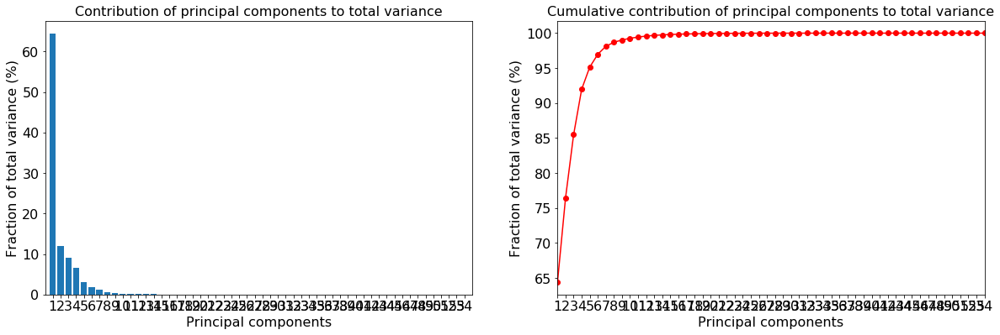

In [8]:
_, _, _ = plot_PCA_contributions(df)

As it is evident, 6 components are enough to explain more than 95% of total variance. Precisely:

In [11]:
num_pc = 6
pca, _, _ = make_PCA(df, num_pc)

96.97% of the variance is explained by the first   6 PCs


We can get the 6 'statistical' factors, projecting the original dataset onto the 6 dimensional space described be the 6 PCs (eigen-vectors of the covariance matrix of X).   

In [12]:
df_x_pca = pca.transform(df)

# For clarity: what is implemented by the .transform() method of the PCA class, 
# can reproduced manually as the following projection of the (de-meaned) dataset 
# onto the pca.components_ eigenvectors:
# 
# df_x_pca = (df_x - df_x.mean()).dot(pca.components_.T).values

df_PCx = pd.DataFrame(columns=['PCx'+str(i+1) for i in range(num_pc)], 
                              index=df_x.index,
                              data=df_x_pca)
df_PCx.head()

,PCx1,PCx2,PCx3,PCx4,PCx5,PCx6
0,0.129993,-0.093930,0.014208,-0.884041,0.065279,-0.009696
1,0.129353,-0.089726,0.012468,-0.847450,0.061536,-0.010657
2,0.128760,-0.085720,0.010852,-0.812059,0.057876,-0.011505
3,0.127920,-0.078213,0.007642,-0.744637,0.050210,-0.013154
4,0.127191,-0.075702,0.006780,-0.722951,0.048588,-0.013442


We can take a look at those PCs. We observe the 'key' shapes of the series in X.

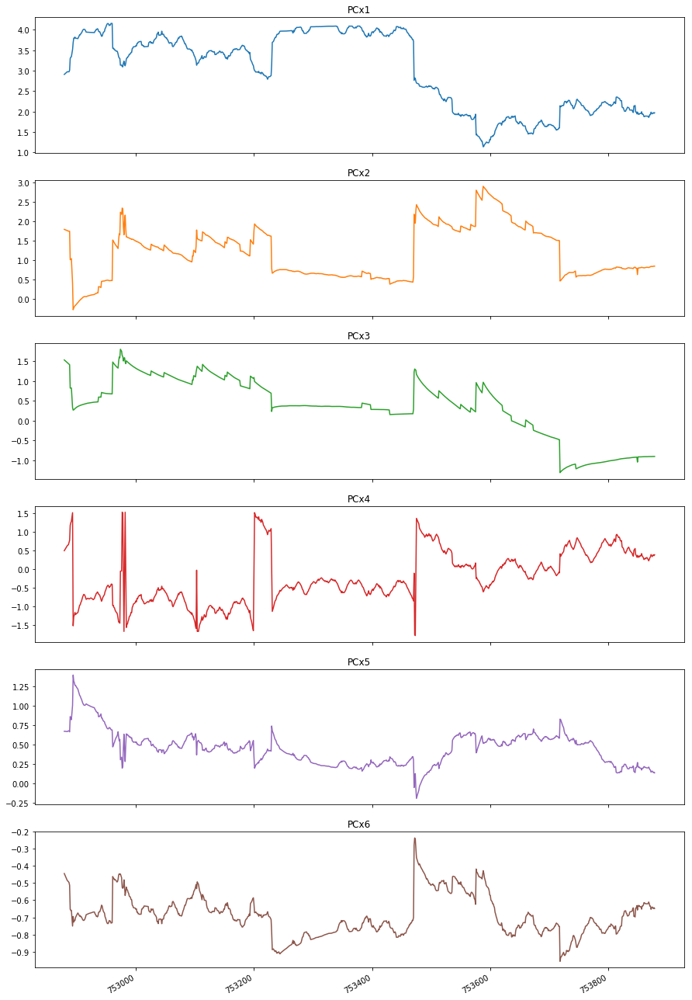

In [15]:
df_PCx.loc[t1:t2,:].plot(subplots=True, figsize=(15,5*5), legend=False, title=list(df_PCx.columns))
plt.show()

## Exploratory analysis on the Y dataset

A first look at Y dataset clearly shows similarities between each $y_i$ $i=1,5$ and clusters synchrounously sampled X time series.

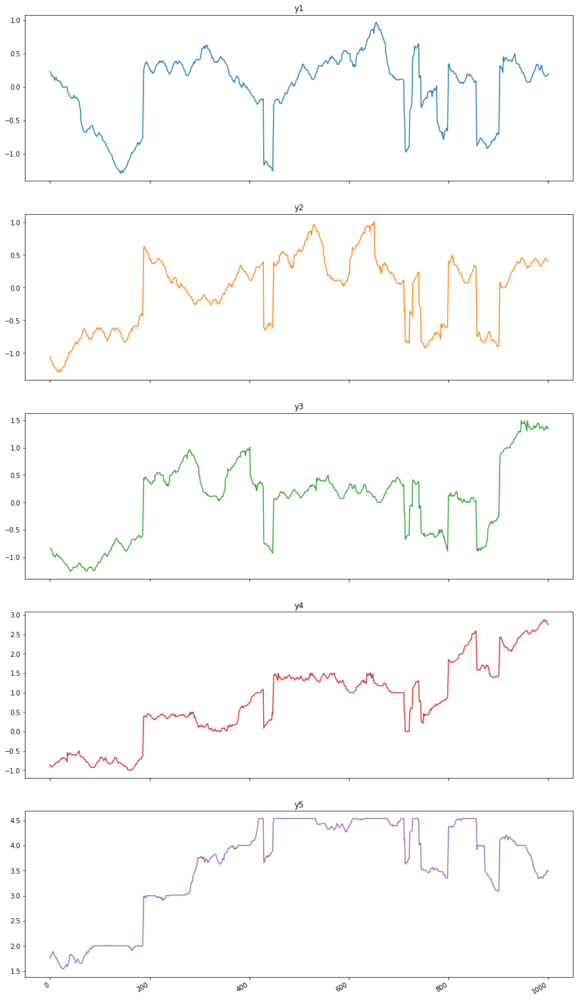

In [3]:
t1 = 0
t2 = 1000 #df_x.shape[0]
#t2 = df_y.shape[0]
#t1 = t2-1000
df_y.loc[t1:t2,:].plot(subplots=True, figsize=(15,5*6), legend=False, title=list(df_y.columns))
plt.show()

It is clear that both X and Y series feature structural changes. And these seem to be syncronous.

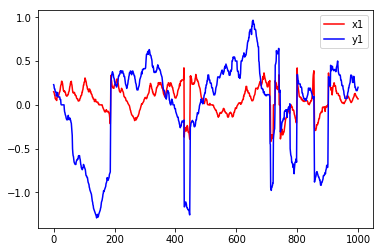

In [4]:
df_x.loc[t1:t2,'x1'].plot(color='r')
df_y.loc[t1:t2,'y1'].plot(color='b')
plt.legend()

Interestingly, the 'x56' spikes seem to be related with the structural changes in both X and Y.

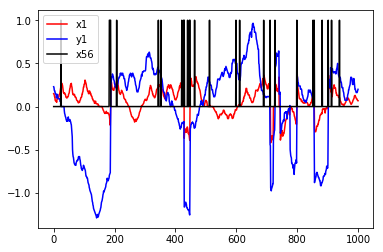

In [5]:
df_x.loc[t1:t2,'x1'].plot(color='r')
df_y.loc[t1:t2,'y1'].plot(color='b')
df_x.loc[t1:t2,'x56'].plot(color='k')
plt.legend()

Let's have a look at returns time series

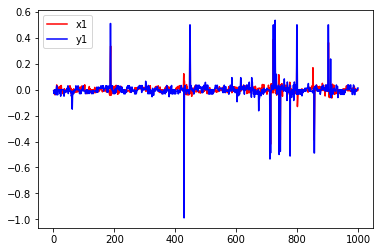

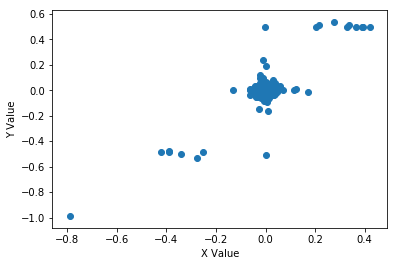

In [24]:
df_x.loc[t1:t2,'x1'].diff()[1:].plot(color='r')
df_y.loc[t1:t2,'y1'].diff()[1:].plot(color='b')
#df_x.loc[t1:t2,'x56'].plot(color='k')
plt.legend()
plt.show()

plt.scatter(df_x.loc[t1:t2,'x1'].diff()[1:], df_y.loc[t1:t2,'y1'].diff()[1:]) # Plot the raw data
plt.xlabel('X Value')
plt.ylabel('Y Value')
#plt.ylim([-10,10])
#plt.xlim([-10,10])
plt.show()

# Analysis

### Set the training and test sets to be used (default: 80%/20%)

In [125]:
def splitTrainAndTestSeries(x,y,frac):
    """
    Arg:
        x: pd.DataFrame of X time series
        y: pd.DataFrame of Y time series
        frac: fraction of the total sample to keep as training set (0 < frac <= 1)
    
    return:
        x_trainHalf, x_testHalf: original X split into train and test periods, test half is re-indexed to start from 0.
        y_trainHalf, y_testHalf: original Y split into train and test periods, test half is re-indexed to start from 0.
        T_train, T_test: length of train and test halves
    """

    T = x.shape[0]

    # X
    x_trainHalf = x.loc[:int(frac*T),:]
    x_testHalf  = x.loc[int(frac*T)+1:,:]
    
    # Y
    y_trainHalf = y.loc[:int(frac*T),:]
    y_testHalf  = y.loc[int(frac*T)+1:,:]
    
    # train and test halves length
    T_train = x_trainHalf.shape[0]
    T_test = x_testHalf.shape[0]
    
    # re-indexing of test halves
    x_testHalf.index = range(T_test)
    y_testHalf.index = range(T_test)


    return x_trainHalf, x_testHalf, y_trainHalf, y_testHalf, T_train, T_test


The effective training set will be a window of length $w_{train}$ at the end of the training set. The test set will be a window of same length $w_{test}$ at the beginning of the test set.

In [278]:
def setTrainAndTestSeries(x,y,frac=0.8,w_train=250,w_test=250,offset_train=0,col_x=None,col_y=None):
    """
    Arg:
        x: pd.DataFrame of X time series
        y: pd.DataFrame of Y time series
        frac: fraction of the total sample to keep as training set (0 < frac <= 1)
        w_train: length of the training set
        w_test: length of the test set
        offset_train: the training window is [T_train - w_train - offset_train : T_train - offset_train]. 
                      If offset_train = 0 (default) the training window is [T_train - w_train : T_train], 
                      ending in T_train.
        col_x: str or list of X columns to filter (default: None). If None, all columns are returned.
        col_y: str or list of Y columns to filter (default: None). If None, all columns are returned.
    
    return:
        x_train, x_test: 0 indexed train and test X time-series.
        y_train, y_test: 0 indexed train and test Y time-series.
    """
    
    # split original series in train and test periods
    x_trainHalf, x_testHalf, y_trainHalf, y_testHalf, T_train, _ = splitTrainAndTestSeries(x,y,frac)
    
    if col_x is None:
        x_train = x_trainHalf.loc[T_train - w_train - offset_train : T_train - offset_train - 1, :]
        x_test = x_testHalf.loc[:w_test-1,:]
    else:
        x_train = x_trainHalf.loc[T_train - w_train - offset_train : T_train - offset_train  - 1, col_x]
        x_test = x_testHalf.loc[:w_test-1,col_x]
        
    if col_y is None:
        y_train = y_trainHalf.loc[T_train - w_train - offset_train : T_train - offset_train  - 1 , :]
        y_test = y_testHalf.loc[:w_test-1,:]
    else:
        y_train = y_trainHalf.loc[T_train - w_train - offset_train : T_train - offset_train  - 1, col_y]
        y_test = y_testHalf.loc[:w_test-1,col_y]
    
    # re-index of train set to start from zero
    x_train.index = range(w_train)
    y_train.index = range(w_train)
    
    return x_train, x_test, y_train, y_test
    

## Model 1: Linear regression

The first model I tried is a linear regression model:
$$
y_t = \alpha + \beta \cdot PCx_t + \epsilon
$$
performed for each $y_{i,t}$, $i=1,...,5$ against each of the 6 PCs 'PCx1',...,'PCx6'. If we denote with $T_{train}$ the end of the training set period, the  regression is runned regression is run over $[T_{train}-w_{train}:T_{train}]$ and the prediction is made over $[T_{train}:T_{train}+w_{test}]$ (default $w_{train}=w_{test}=250$).

In [195]:
def runLinearModel(x_train, x_test, y_train, y_test, IO=False):
    
    # Running the linear regression
    linearModelFit = regression.linear_model.OLS(y_train, sm.add_constant(x_train)).fit()
    
    alpha = linearModelFit.params[0]
    beta = linearModelFit.params[1]
    
    y_train_pred = alpha + beta*x_train    
    y_train_pred.name = y_train.name + '_pred [trained]'

    y_test_pred = alpha + beta*x_test
    y_test_pred.name = y_test.name + '_pred [test]'
    
    RMSE_train = np.sqrt(np.mean((y_train_pred.values - y_train.values) ** 2))
    RMSE_test = np.sqrt(np.mean((y_test_pred.values - y_test.values) ** 2))
 
    if IO:
        print('RMSE in-sample = {0:.2f}'.format(RMSE_train))
        print('RMSE out-of-sample = {0:.2f}'.format(RMSE_test))
        print(linearModelFit.summary())

    return linearModelFit, y_train_pred, y_test_pred, RMSE_train, RMSE_test

In [385]:
def plotModel(x_train, x_test, y_train, y_test, y_train_pred, y_test_pred, titleString='', plot_x = True, plotTrain=True, plotTest=True):

    if plotTrain:
        # in-sample
        if plot_x:
            x_train.plot(color='r')
        y_train.plot(color='b')
        y_train_pred.plot(color='k')
        plt.title('In sample'+titleString)
        plt.legend()
        plt.show()

    if plotTest:
        # out-of-sample
        if plot_x:
            x_test.plot(color='r')
        y_test.plot(color='b')
        y_test_pred.plot(color='k')
        plt.title('Out of sample'+titleString)
        plt.legend()
        plt.show()
    
    return None

Results of linear regression model are quite poor, even if $(\alpha, \beta)$ are usually significant.

RMSE in-sample = 0.15
RMSE out-of-sample = 0.44
                            OLS Regression Results                            
Dep. Variable:                     y1   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.916
Method:                 Least Squares   F-statistic:                     2718.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.20e-135
Time:                        21:20:33   Log-Likelihood:                 116.15
No. Observations:                 250   AIC:                            -228.3
Df Residuals:                     248   BIC:                            -221.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

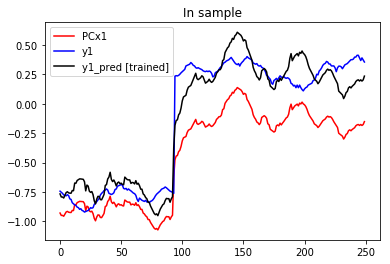

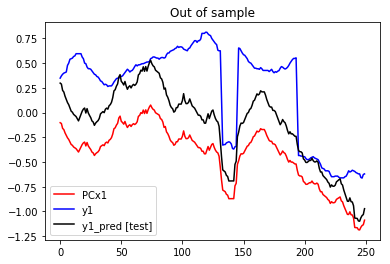

RMSE in-sample = 0.13
RMSE out-of-sample = 0.43
                            OLS Regression Results                            
Dep. Variable:                     y1   R-squared:                       0.935
Model:                            OLS   Adj. R-squared:                  0.935
Method:                 Least Squares   F-statistic:                     3595.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.34e-149
Time:                        21:20:34   Log-Likelihood:                 148.53
No. Observations:                 250   AIC:                            -293.1
Df Residuals:                     248   BIC:                            -286.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

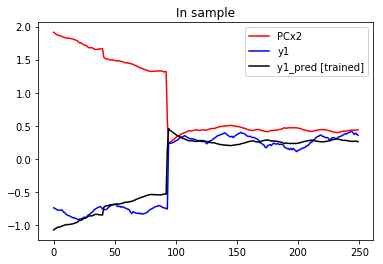

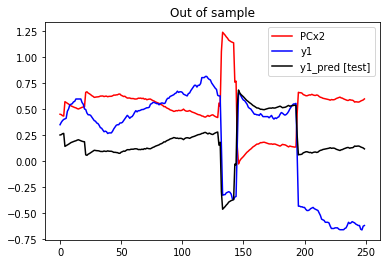

RMSE in-sample = 0.30
RMSE out-of-sample = 0.66
                            OLS Regression Results                            
Dep. Variable:                     y1   R-squared:                       0.676
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     518.2
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           1.11e-62
Time:                        21:20:35   Log-Likelihood:                -53.066
No. Observations:                 250   AIC:                             110.1
Df Residuals:                     248   BIC:                             117.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

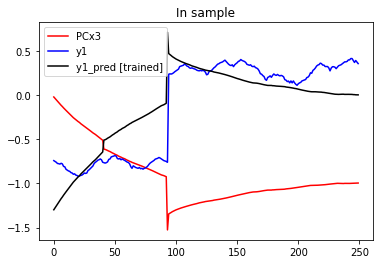

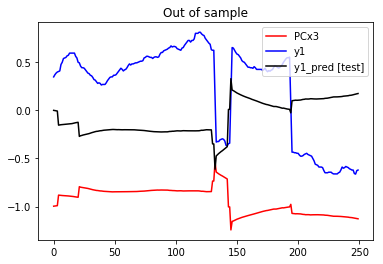

RMSE in-sample = 0.14
RMSE out-of-sample = 0.29
                            OLS Regression Results                            
Dep. Variable:                     y1   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     3459.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.19e-147
Time:                        21:20:36   Log-Likelihood:                 144.00
No. Observations:                 250   AIC:                            -284.0
Df Residuals:                     248   BIC:                            -277.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

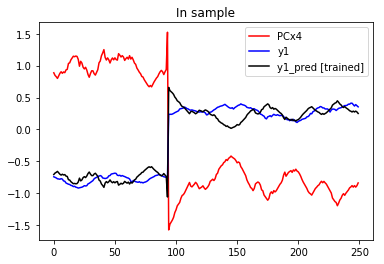

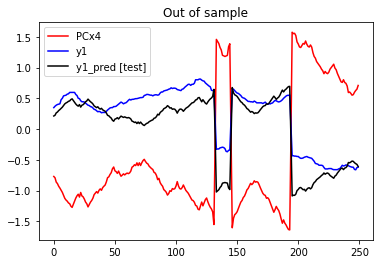

RMSE in-sample = 0.50
RMSE out-of-sample = 0.53
                            OLS Regression Results                            
Dep. Variable:                     y1   R-squared:                       0.110
Model:                            OLS   Adj. R-squared:                  0.106
Method:                 Least Squares   F-statistic:                     30.66
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           7.83e-08
Time:                        21:20:36   Log-Likelihood:                -179.49
No. Observations:                 250   AIC:                             363.0
Df Residuals:                     248   BIC:                             370.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

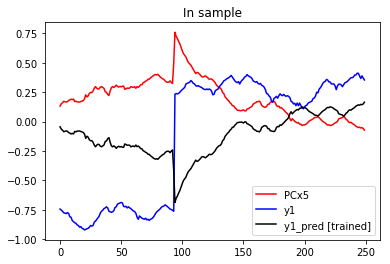

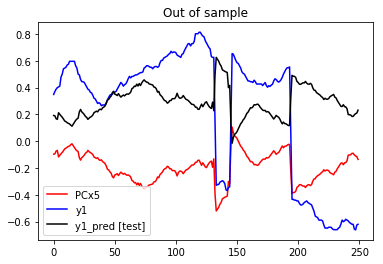

RMSE in-sample = 0.48
RMSE out-of-sample = 0.92
                            OLS Regression Results                            
Dep. Variable:                     y1   R-squared:                       0.175
Model:                            OLS   Adj. R-squared:                  0.171
Method:                 Least Squares   F-statistic:                     52.47
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           5.49e-12
Time:                        21:20:37   Log-Likelihood:                -170.07
No. Observations:                 250   AIC:                             344.1
Df Residuals:                     248   BIC:                             351.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

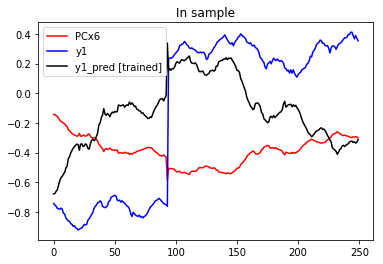

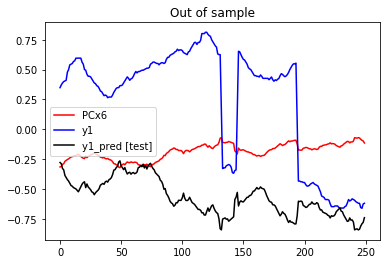

RMSE in-sample = 0.19
RMSE out-of-sample = 0.37
                            OLS Regression Results                            
Dep. Variable:                     y2   R-squared:                       0.901
Model:                            OLS   Adj. R-squared:                  0.901
Method:                 Least Squares   F-statistic:                     2266.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          9.75e-127
Time:                        21:20:38   Log-Likelihood:                 60.455
No. Observations:                 250   AIC:                            -116.9
Df Residuals:                     248   BIC:                            -109.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

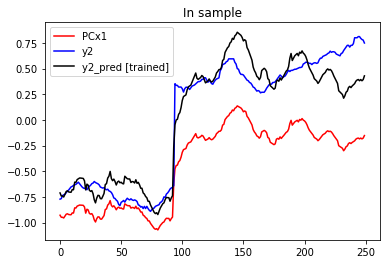

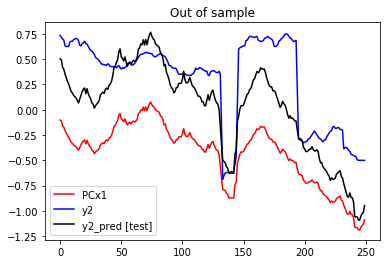

RMSE in-sample = 0.22
RMSE out-of-sample = 0.34
                            OLS Regression Results                            
Dep. Variable:                     y2   R-squared:                       0.872
Model:                            OLS   Adj. R-squared:                  0.872
Method:                 Least Squares   F-statistic:                     1693.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          8.68e-113
Time:                        21:20:38   Log-Likelihood:                 28.092
No. Observations:                 250   AIC:                            -52.18
Df Residuals:                     248   BIC:                            -45.14
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

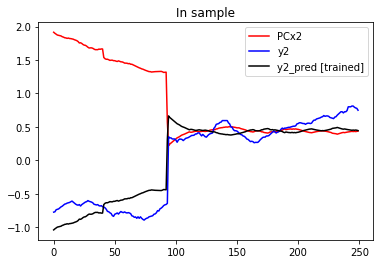

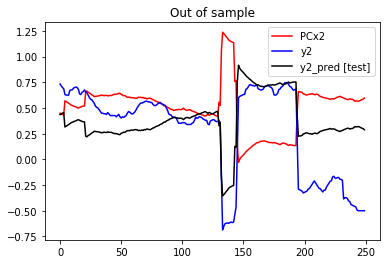

RMSE in-sample = 0.41
RMSE out-of-sample = 0.54
                            OLS Regression Results                            
Dep. Variable:                     y2   R-squared:                       0.543
Model:                            OLS   Adj. R-squared:                  0.542
Method:                 Least Squares   F-statistic:                     295.1
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           4.18e-44
Time:                        21:20:39   Log-Likelihood:                -131.10
No. Observations:                 250   AIC:                             266.2
Df Residuals:                     248   BIC:                             273.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

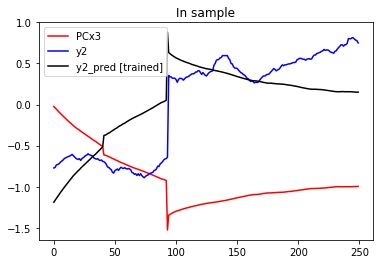

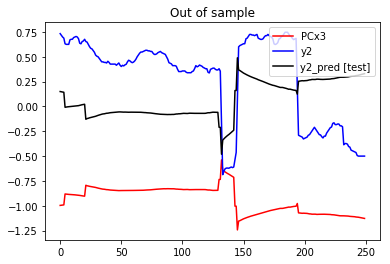

RMSE in-sample = 0.19
RMSE out-of-sample = 0.29
                            OLS Regression Results                            
Dep. Variable:                     y2   R-squared:                       0.901
Model:                            OLS   Adj. R-squared:                  0.901
Method:                 Least Squares   F-statistic:                     2268.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          9.13e-127
Time:                        21:20:39   Log-Likelihood:                 60.521
No. Observations:                 250   AIC:                            -117.0
Df Residuals:                     248   BIC:                            -110.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

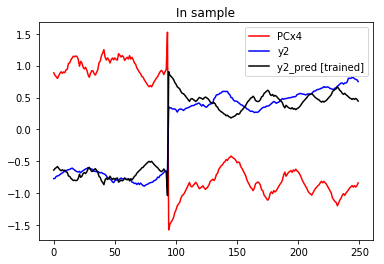

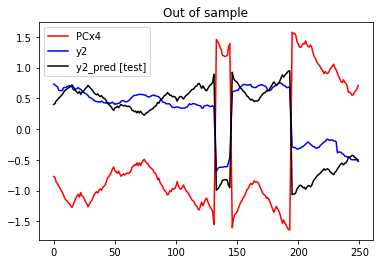

RMSE in-sample = 0.54
RMSE out-of-sample = 0.68
                            OLS Regression Results                            
Dep. Variable:                     y2   R-squared:                       0.217
Model:                            OLS   Adj. R-squared:                  0.214
Method:                 Least Squares   F-statistic:                     68.75
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           7.12e-15
Time:                        21:20:40   Log-Likelihood:                -198.49
No. Observations:                 250   AIC:                             401.0
Df Residuals:                     248   BIC:                             408.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

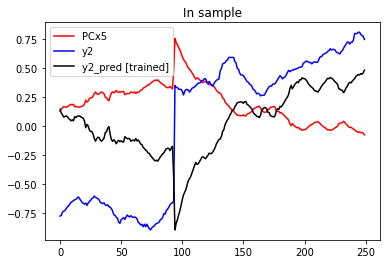

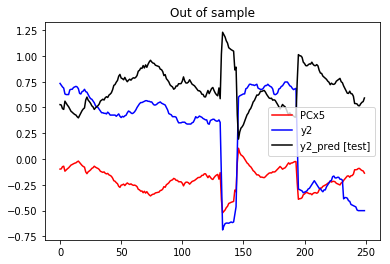

RMSE in-sample = 0.58
RMSE out-of-sample = 0.72
                            OLS Regression Results                            
Dep. Variable:                     y2   R-squared:                       0.077
Model:                            OLS   Adj. R-squared:                  0.073
Method:                 Least Squares   F-statistic:                     20.72
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           8.35e-06
Time:                        21:20:41   Log-Likelihood:                -219.05
No. Observations:                 250   AIC:                             442.1
Df Residuals:                     248   BIC:                             449.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

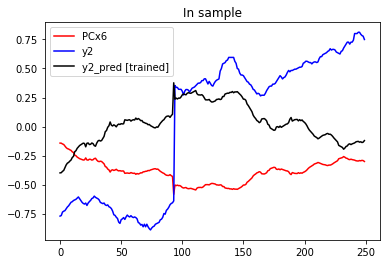

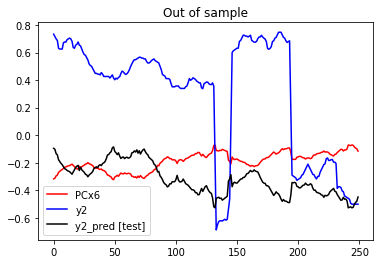

RMSE in-sample = 0.18
RMSE out-of-sample = 0.30
                            OLS Regression Results                            
Dep. Variable:                     y3   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     1772.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          6.19e-115
Time:                        21:20:41   Log-Likelihood:                 67.342
No. Observations:                 250   AIC:                            -130.7
Df Residuals:                     248   BIC:                            -123.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

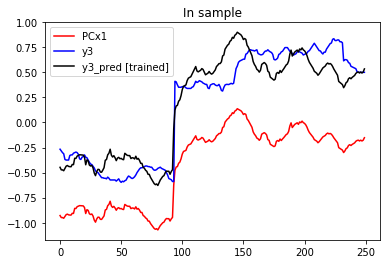

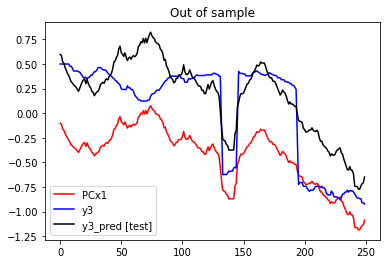

RMSE in-sample = 0.21
RMSE out-of-sample = 0.63
                            OLS Regression Results                            
Dep. Variable:                     y3   R-squared:                       0.838
Model:                            OLS   Adj. R-squared:                  0.837
Method:                 Least Squares   F-statistic:                     1284.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          4.81e-100
Time:                        21:20:42   Log-Likelihood:                 32.802
No. Observations:                 250   AIC:                            -61.60
Df Residuals:                     248   BIC:                            -54.56
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

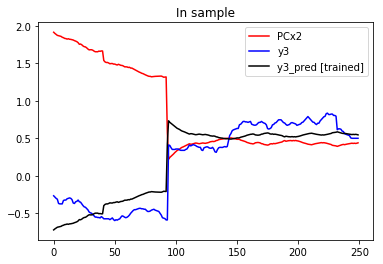

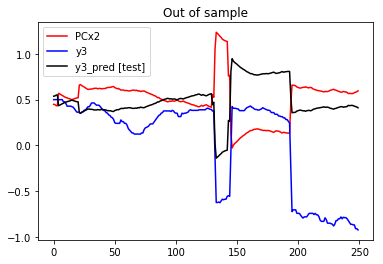

RMSE in-sample = 0.38
RMSE out-of-sample = 0.61
                            OLS Regression Results                            
Dep. Variable:                     y3   R-squared:                       0.488
Model:                            OLS   Adj. R-squared:                  0.486
Method:                 Least Squares   F-statistic:                     236.7
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           5.98e-38
Time:                        21:20:43   Log-Likelihood:                -111.06
No. Observations:                 250   AIC:                             226.1
Df Residuals:                     248   BIC:                             233.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

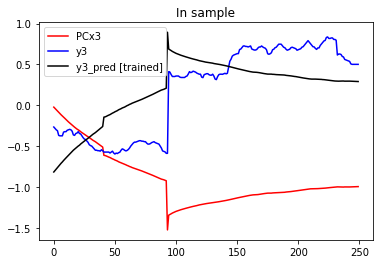

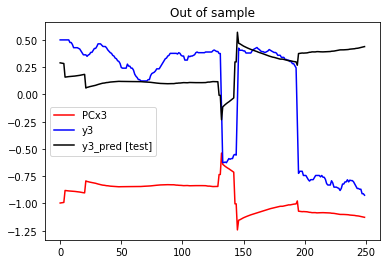

RMSE in-sample = 0.18
RMSE out-of-sample = 0.33
                            OLS Regression Results                            
Dep. Variable:                     y3   R-squared:                       0.887
Model:                            OLS   Adj. R-squared:                  0.887
Method:                 Least Squares   F-statistic:                     1954.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.35e-119
Time:                        21:20:43   Log-Likelihood:                 78.154
No. Observations:                 250   AIC:                            -152.3
Df Residuals:                     248   BIC:                            -145.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

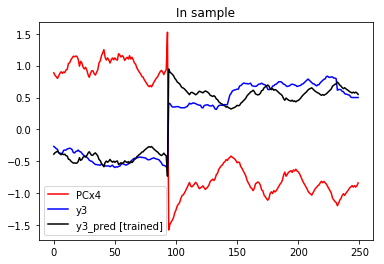

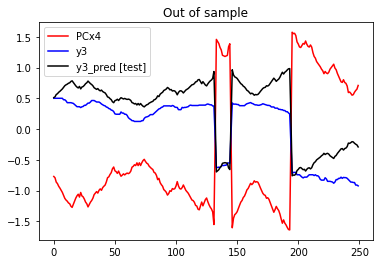

RMSE in-sample = 0.45
RMSE out-of-sample = 0.98
                            OLS Regression Results                            
Dep. Variable:                     y3   R-squared:                       0.258
Model:                            OLS   Adj. R-squared:                  0.255
Method:                 Least Squares   F-statistic:                     86.22
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           8.42e-18
Time:                        21:20:44   Log-Likelihood:                -157.51
No. Observations:                 250   AIC:                             319.0
Df Residuals:                     248   BIC:                             326.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

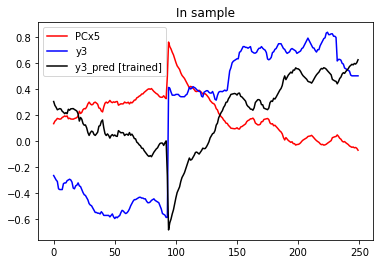

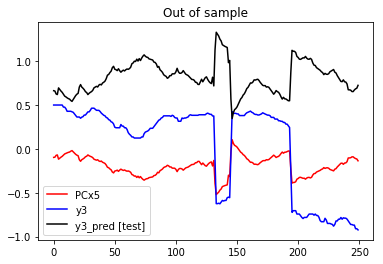

RMSE in-sample = 0.52
RMSE out-of-sample = 0.48
                            OLS Regression Results                            
Dep. Variable:                     y3   R-squared:                       0.045
Model:                            OLS   Adj. R-squared:                  0.041
Method:                 Least Squares   F-statistic:                     11.63
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           0.000757
Time:                        21:20:44   Log-Likelihood:                -189.08
No. Observations:                 250   AIC:                             382.2
Df Residuals:                     248   BIC:                             389.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

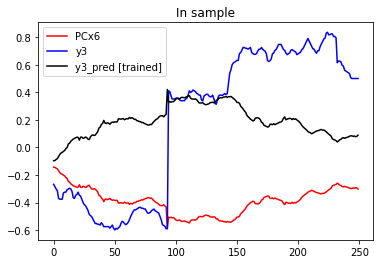

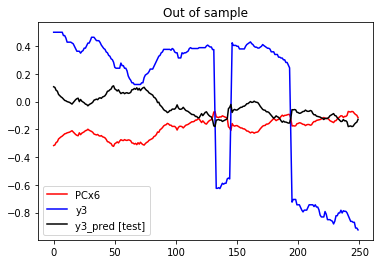

RMSE in-sample = 0.11
RMSE out-of-sample = 0.40
                            OLS Regression Results                            
Dep. Variable:                     y4   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     3744.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.21e-151
Time:                        21:20:45   Log-Likelihood:                 186.38
No. Observations:                 250   AIC:                            -368.8
Df Residuals:                     248   BIC:                            -361.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

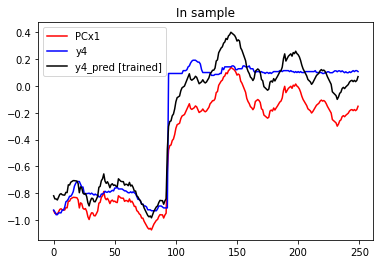

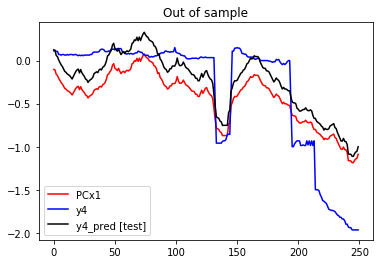

RMSE in-sample = 0.13
RMSE out-of-sample = 0.73
                            OLS Regression Results                            
Dep. Variable:                     y4   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.922
Method:                 Least Squares   F-statistic:                     2940.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.55e-139
Time:                        21:20:46   Log-Likelihood:                 158.29
No. Observations:                 250   AIC:                            -312.6
Df Residuals:                     248   BIC:                            -305.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

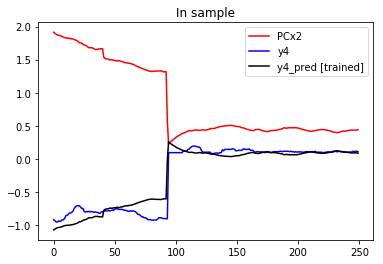

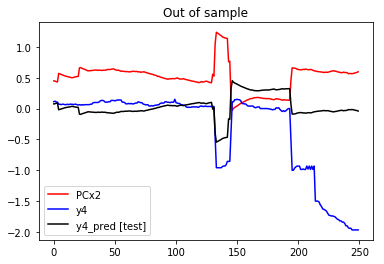

RMSE in-sample = 0.27
RMSE out-of-sample = 0.78
                            OLS Regression Results                            
Dep. Variable:                     y4   R-squared:                       0.648
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                     456.4
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           3.81e-58
Time:                        21:20:46   Log-Likelihood:                -30.460
No. Observations:                 250   AIC:                             64.92
Df Residuals:                     248   BIC:                             71.96
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

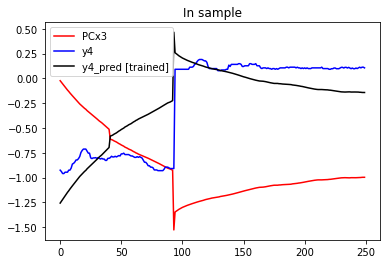

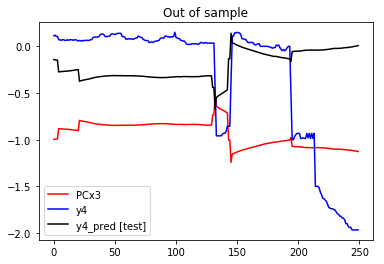

RMSE in-sample = 0.12
RMSE out-of-sample = 0.43
                            OLS Regression Results                            
Dep. Variable:                     y4   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                     3280.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          5.45e-145
Time:                        21:20:47   Log-Likelihood:                 170.94
No. Observations:                 250   AIC:                            -337.9
Df Residuals:                     248   BIC:                            -330.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

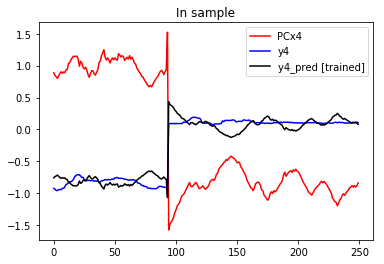

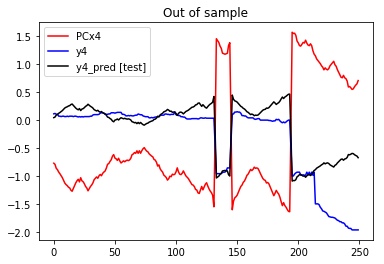

RMSE in-sample = 0.43
RMSE out-of-sample = 0.85
                            OLS Regression Results                            
Dep. Variable:                     y4   R-squared:                       0.117
Model:                            OLS   Adj. R-squared:                  0.114
Method:                 Least Squares   F-statistic:                     32.92
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           2.79e-08
Time:                        21:20:47   Log-Likelihood:                -145.36
No. Observations:                 250   AIC:                             294.7
Df Residuals:                     248   BIC:                             301.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

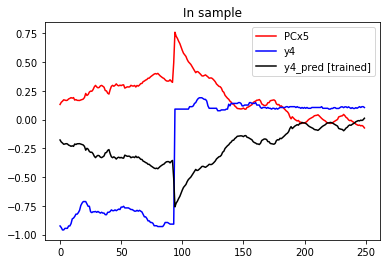

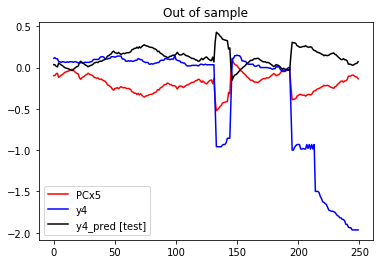

RMSE in-sample = 0.42
RMSE out-of-sample = 0.69
                            OLS Regression Results                            
Dep. Variable:                     y4   R-squared:                       0.172
Model:                            OLS   Adj. R-squared:                  0.168
Method:                 Least Squares   F-statistic:                     51.38
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           8.70e-12
Time:                        21:20:48   Log-Likelihood:                -137.41
No. Observations:                 250   AIC:                             278.8
Df Residuals:                     248   BIC:                             285.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

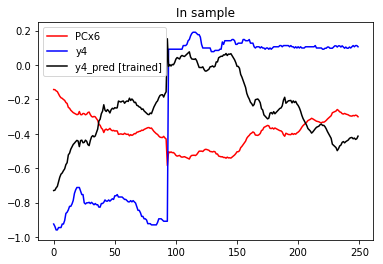

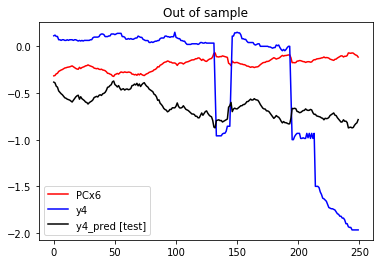

RMSE in-sample = 0.14
RMSE out-of-sample = 0.26
                            OLS Regression Results                            
Dep. Variable:                     y5   R-squared:                       0.919
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                     2815.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          2.22e-137
Time:                        21:20:49   Log-Likelihood:                 134.68
No. Observations:                 250   AIC:                            -265.4
Df Residuals:                     248   BIC:                            -258.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

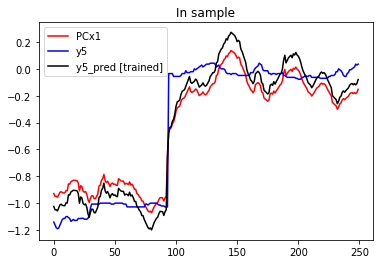

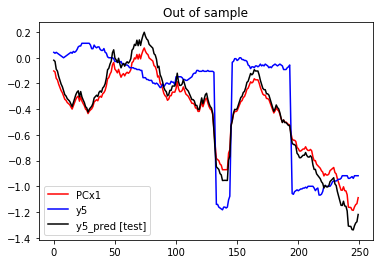

RMSE in-sample = 0.10
RMSE out-of-sample = 0.43
                            OLS Regression Results                            
Dep. Variable:                     y5   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     5322.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.37e-169
Time:                        21:20:49   Log-Likelihood:                 209.42
No. Observations:                 250   AIC:                            -414.8
Df Residuals:                     248   BIC:                            -407.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

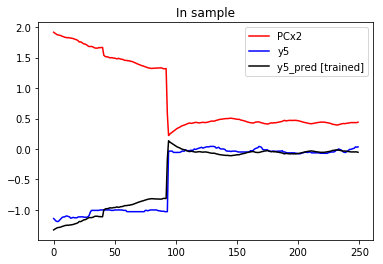

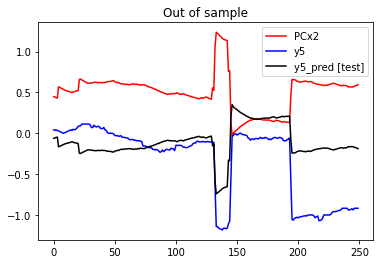

RMSE in-sample = 0.27
RMSE out-of-sample = 0.52
                            OLS Regression Results                            
Dep. Variable:                     y5   R-squared:                       0.708
Model:                            OLS   Adj. R-squared:                  0.707
Method:                 Least Squares   F-statistic:                     601.4
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           3.03e-68
Time:                        21:20:50   Log-Likelihood:                -25.667
No. Observations:                 250   AIC:                             55.33
Df Residuals:                     248   BIC:                             62.38
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

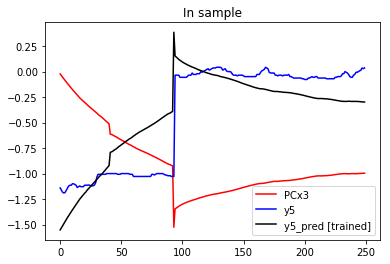

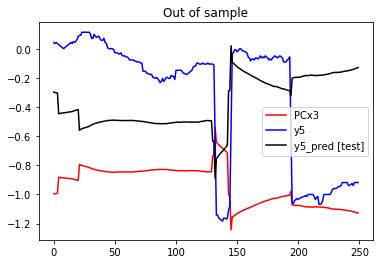

RMSE in-sample = 0.11
RMSE out-of-sample = 0.16
                            OLS Regression Results                            
Dep. Variable:                     y5   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:                  0.947
Method:                 Least Squares   F-statistic:                     4448.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          2.15e-160
Time:                        21:20:50   Log-Likelihood:                 188.08
No. Observations:                 250   AIC:                            -372.2
Df Residuals:                     248   BIC:                            -365.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

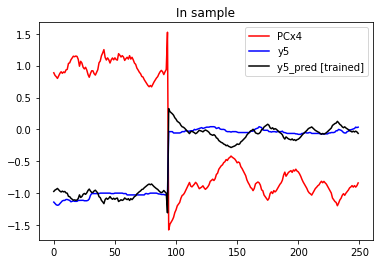

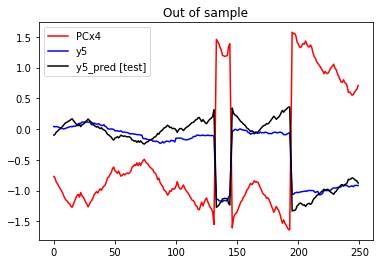

RMSE in-sample = 0.47
RMSE out-of-sample = 0.57
                            OLS Regression Results                            
Dep. Variable:                     y5   R-squared:                       0.099
Model:                            OLS   Adj. R-squared:                  0.095
Method:                 Least Squares   F-statistic:                     27.28
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           3.72e-07
Time:                        21:20:51   Log-Likelihood:                -166.51
No. Observations:                 250   AIC:                             337.0
Df Residuals:                     248   BIC:                             344.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

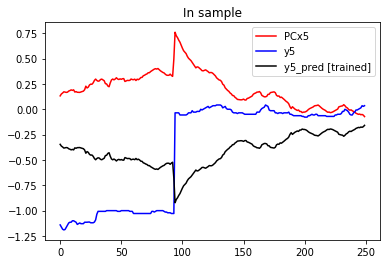

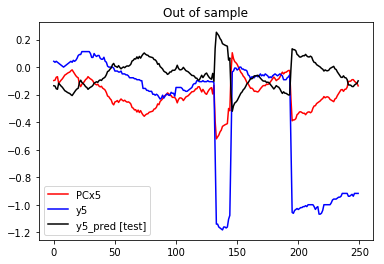

RMSE in-sample = 0.45
RMSE out-of-sample = 0.65
                            OLS Regression Results                            
Dep. Variable:                     y5   R-squared:                       0.191
Model:                            OLS   Adj. R-squared:                  0.188
Method:                 Least Squares   F-statistic:                     58.57
Date:                Mon, 27 Aug 2018   Prob (F-statistic):           4.35e-13
Time:                        21:20:52   Log-Likelihood:                -153.05
No. Observations:                 250   AIC:                             310.1
Df Residuals:                     248   BIC:                             317.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

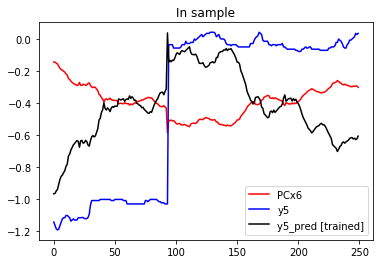

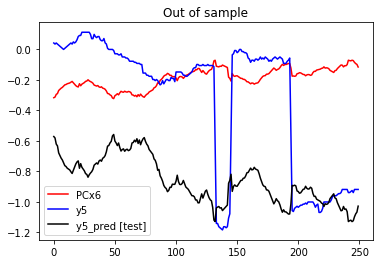

In [547]:
results = {}
results['Linear regression'] = {}
results['Linear regression']['Train'] = {}
results['Linear regression']['Test'] = {}

# loop over the y to be predicted
for y_i in df_y.columns:
    
    results['Linear regression']['Train'][y_i] = {} 
    results['Linear regression']['Test'][y_i] = {} 
    
    # loop over the singel PCs used as predictors in a linear regression model
    for PCx_j in df_PCx.columns:
        
        # retrieve test series for training and prediction
        x_train, x_test, y_train, y_test = setTrainAndTestSeries(x=df_PCx,y=df_y,
                                                                 col_x=PCx_j,col_y=y_i)
        
        # run the linear regression and retrieve predicted y (both in- and out- of sample)
        linearModelFitted, y_train_pred, y_test_pred, RMSE_train, RMSE_test = runLinearModel(x_train, x_test, 
                                                                                             y_train, y_test, 
                                                                                             IO=True)
        
        # plot model predictions (in- and out- of sample, for comparison)
        plotModel(x_train, x_test, y_train, y_test, y_train_pred, y_test_pred)
        
        results['Linear regression']['Train'][y_i]['LR_'+PCx_j] = RMSE_train
        results['Linear regression']['Test'][y_i]['LR_'+PCx_j] = RMSE_test

trainResultLinearModel = pd.DataFrame(results['Linear regression']['Train'])
testResultLinearModel = pd.DataFrame(results['Linear regression']['Test'])
trainResultLinearModel.name='LR'
testResultLinearModel.name='LR'

In [548]:
trainResults = trainResultLinearModel
testResults = testResultLinearModel

To measure the quality of in- and out- of sample prediction, we can look at the in- and out- of sample RMSE (Root Mean Squared Error)

$$
RMSE = \sqrt{\frac{1}{w} \sum_{t=0}^{w-1} (y_t - \hat{y}_t)^2}
$$

where $w=w_{train}$ (in-sample) $w=w_{test}$ (out-of-sample) and
$$
\hat{y}_t = \alpha + \beta x_t
$$
We see that:
- in sample: PCx1,PCx2 and PCx4 are equally promising for all the y;
- out of sample: only PCx1 and PCx4 are somehow consistent out of sample.

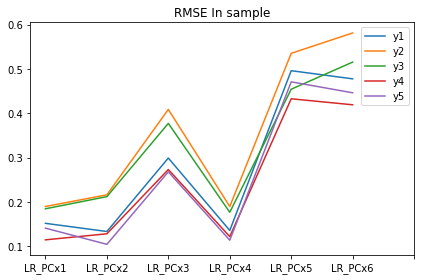

,y1,y2,y3,y4,y5
LR_PCx1,0.152051,0.189995,0.184832,0.114813,0.141190
LR_PCx2,0.133582,0.216253,0.212217,0.128466,0.104705
LR_PCx3,0.299190,0.408789,0.377306,0.273323,0.268133
LR_PCx4,0.136021,0.189945,0.177009,0.122126,0.114034
LR_PCx5,0.496102,0.535281,0.454352,0.432800,0.470991
LR_PCx6,0.477755,0.581159,0.515503,0.419247,0.446309


In [549]:
ax=trainResults.plot()
ax.set_xticks(range(len(trainResults.index.values)+1))
ax.set_xticklabels(trainResults.index.values)
plt.title('RMSE In sample')
plt.tight_layout()
plt.show()

trainResultLinearModel

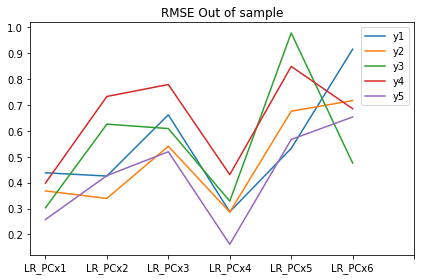

,y1,y2,y3,y4,y5
LR_PCx1,0.437942,0.367888,0.302783,0.398135,0.257347
LR_PCx2,0.425370,0.338904,0.625755,0.732607,0.426990
LR_PCx3,0.661684,0.540318,0.608685,0.778618,0.519273
LR_PCx4,0.287331,0.286109,0.328546,0.430902,0.161760
LR_PCx5,0.532020,0.675560,0.977715,0.848494,0.566461
LR_PCx6,0.915018,0.716783,0.475248,0.685394,0.653452


In [550]:
ax=testResults.plot()
ax.set_xticks(range(len(testResults.index.values)+1))
ax.set_xticklabels(testResults.index.values)
plt.title('RMSE Out of sample')
plt.tight_layout()
plt.show()

testResultLinearModel

Considering 'y4' as example, I would like to understand why 'PCx4' out-performs 'PCx2' out-of-sample 
$$
RMSE_{PCx4,test}=0.43 < RMSE_{PCx2,test}= 0.73
$$
given their similar performance in-sample 
$$
RMSE_{PCx4,train}=0.12 \simeq RMSE_{PCx2,test}= 0.13
$$

We can re-run the analysis to compare the two cases. Looking at the in- and out- of sample correlations, we see that PCx4 keeps a high degree of (anti-) correlation with y4 also in the test part (-0.96 and -0.85, respectively), while PCx2 becomes less correlated (from -0.96 to -0.37).

[train] corr(PCx2,y4) = -0.9603230526840629
[test] corr(PCx2,y4) = -0.3735046662282994
RMSE in-sample = 0.13
RMSE out-of-sample = 0.73
                            OLS Regression Results                            
Dep. Variable:                     y4   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.922
Method:                 Least Squares   F-statistic:                     2940.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.55e-139
Time:                        21:23:42   Log-Likelihood:                 158.29
No. Observations:                 250   AIC:                            -312.6
Df Residuals:                     248   BIC:                            -305.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.9

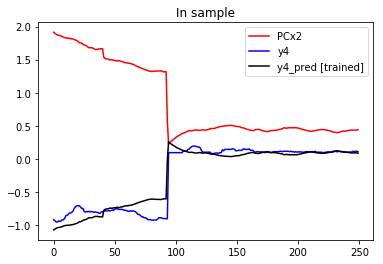

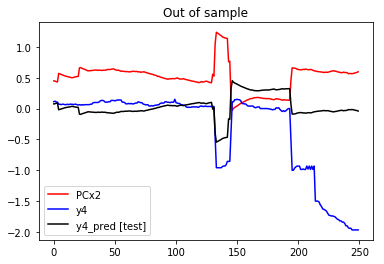

[train] corr(PCx4,y4) = -0.9642135015109609
[test] corr(PCx4,y4) = -0.8541526207475868
RMSE in-sample = 0.12
RMSE out-of-sample = 0.43
                            OLS Regression Results                            
Dep. Variable:                     y4   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                     3280.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          5.45e-145
Time:                        21:23:42   Log-Likelihood:                 170.94
No. Observations:                 250   AIC:                            -337.9
Df Residuals:                     248   BIC:                            -330.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.9

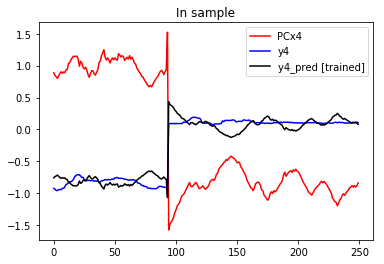

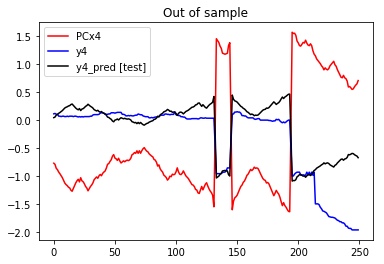

In [551]:
# loop over the y to be predicted
for y_i in ['y4']:
    
    # loop over the singel PCs used as predictors in a linear regression model
    for PCx_j in ['PCx2','PCx4']:
        
        # retrieve test series for training and prediction
        x_train, x_test, y_train, y_test = setTrainAndTestSeries(x=df_PCx,y=df_y,
                                                                 col_x=PCx_j,col_y=y_i)
        
        print('[train] corr('+PCx_j+','+y_i+') = {}'.format(pd.concat([x_train, y_train], axis=1).corr().iloc[0,1]))
        print('[test] corr('+PCx_j+','+y_i+') = {}'.format(pd.concat([x_test, y_test], axis=1).corr().iloc[0,1]))
        
        # run the linear regression and retrieve predicted y (both in- and out- of sample)
        linearModelFitted, y_train_pred, y_test_pred, RMSE_train, RMSE_test = runLinearModel(x_train, x_test, 
                                                                                             y_train, y_test, 
                                                                                             IO=True)
        
        # plot model predictions (in- and out- of sample, for comparison)
        plotModel(x_train, x_test, y_train, y_test, y_train_pred, y_test_pred)

So, we see that, a change in the correlation regime between the train- and test- periods likely drives a deterioration of the prediction.

Intuitively, the presence of jumps in the time series, makes a model with a single $(\alpha,\beta)$, highly un-likely to be predictive.

Indeed, we can analyze the effect of jumps on rolling estimates of intercept and slope. The folliwing run the linear model over rollowing windows:
$$
[T_{train}-w_{train}-500:T_{train}-500], [T_{train}-w_{train}-499:T_{train}-499], \dots, [T_{train}-w_{train}:T_{train}]
$$

In [286]:
rolling_w = 500
alpha = []
beta = []

for roll_w in np.arange(rolling_w)[::-1]:

    # retrieve test series for training and prediction
    x_train, x_test, y_train, y_test = setTrainAndTestSeries(x=df_PCx,y=df_y,
                                                             offset_train=roll_w,
                                                             col_x='PCx1',col_y='y1')

    # run the linear regression and retrieve predicted y (both in- and out- of sample)
    linearModelFitted, _, _, _, _ = runLinearModel(x_train, x_test, 
                                                   y_train, y_test, 
                                                   IO=False)
    
    # rolling intercept and slope values
    alpha.append(linearModelFitted.params[0])
    beta.append(linearModelFitted.params[1])

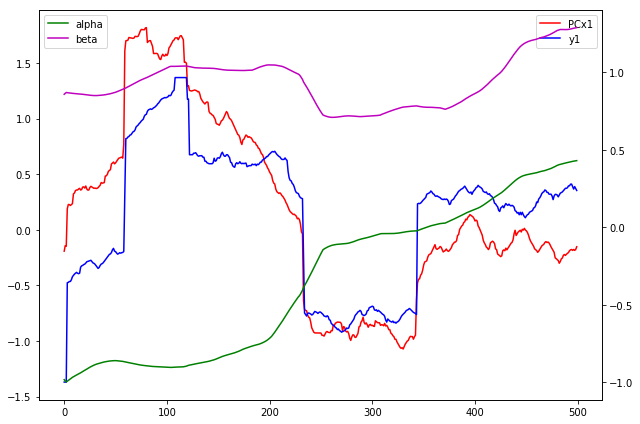

In [289]:
x, _, y, _ = setTrainAndTestSeries(x=df_PCx,y=df_y,
                                   w_train = rolling_w,
                                   offset_train=0,
                                   col_x='PCx1',col_y='y1')

fig, ax1 = plt.subplots(figsize=(9,6))

idx = x.index

ax1.plot(idx, x.values, 'r-', label='PCx1')
ax1.plot(idx, y.values, 'b-', label='y1')
ax1.tick_params('y', colors='k')
plt.legend()
ax2 = ax1.twinx()
ax2.plot(idx, alpha, 'g-', label='alpha')
ax2.plot(idx, beta, 'm-', label='beta')
ax2.tick_params('y', colors='k')

plt.legend()
fig.tight_layout()

plt.show()

This calls for a model with $(\alpha, \beta)$: 
- time-dependent
- with a known dynamics that can be forecasted

spoiler: filter $(\alpha_t, \beta_t)$ as the latent state of a Kalman filter...

Another evidence of the need of a model with a richer dynamics is the fact that increasing the length of the window over which we train the model, $w_{train} = 250 \rightarrow w_{train} = 1000$, actually increases the $RMSE_{train}$, making even less reliable the model out-of-sample. 

We test this over the best predictive model so far: 
$$
y_{5,t} = \alpha + \beta \cdot PCx_{4,t} + \epsilon
$$
We keep $w_{test} = 250$.

In [552]:
results = {}
results['Linear regression'] = {}
results['Linear regression']['Train'] = {}
results['Linear regression']['Test'] = {}

increasing_w_train = np.arange(250,1010,10)

# loop over increasing w_train windows
for w in increasing_w_train:

    # loop over the y to be predicted
    for y_i in ['y5']:

        # loop over the singel PCs used as predictors in a linear regression model
        for PCx_j in ['PCx4']:

            # retrieve test series for training and prediction
            x_train, x_test, y_train, y_test = setTrainAndTestSeries(x=df_PCx,y=df_y,
                                                                     w_train=w,
                                                                     col_x=PCx_j,col_y=y_i)

            # run the linear regression and retrieve predicted y (both in- and out- of sample)
            linearModelFitted, y_train_pred, y_test_pred, RMSE_train, RMSE_test = runLinearModel(x_train, x_test, 
                                                                                                 y_train, y_test, 
                                                                                                 IO=False)

            # plot model predictions (in- and out- of sample, for comparison)
            #plotModel(x_train, x_test, y_train, y_test, y_train_pred, y_test_pred)

            results['Linear regression']['Train'][w] = RMSE_train
            results['Linear regression']['Test'][w] = RMSE_test

trainResult_Wtrain = pd.Series(results['Linear regression']['Train'], index=increasing_w_train)
testResult_Wtrain = pd.Series(results['Linear regression']['Test'], index=increasing_w_train)

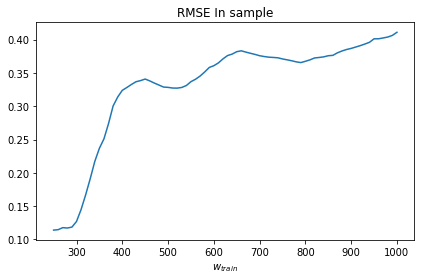

In [553]:
ax=trainResult_Wtrain.plot()
plt.title('RMSE In sample')
plt.xlabel('$w_{train}$')
plt.tight_layout()
plt.show()

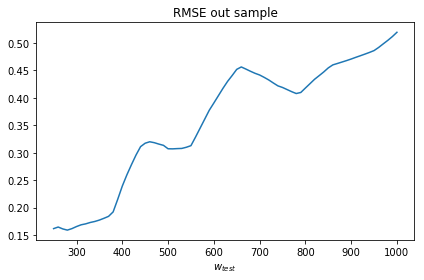

In [554]:
ax=testResult_Wtrain.plot()
plt.title('RMSE out sample')
plt.xlabel('$w_{test}$')
plt.tight_layout()
plt.show()

From these plots, it is clear that between 300 and 400, the in-sample RMSE increases abruptly and, at 400, the out-of-sample RMSE increases a lot as well. Let's see some plots (250,300,350,400,450). The problem seems to be amount of jumps included/excluded in the window $[T_{train}-w_{train}:T_{train}]$.

w_train = 250, [RMSE_train = 0.11; RMSE_test = 0.16], alpha = -0.51, beta = -0.53


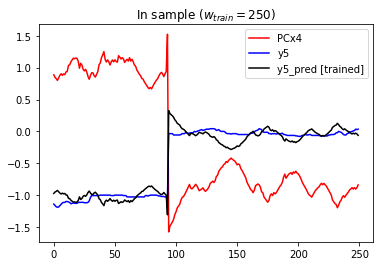

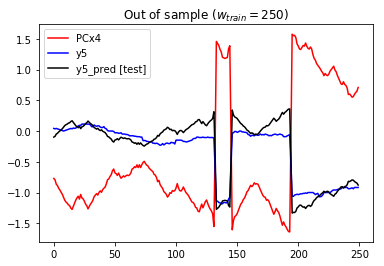

w_train = 300, [RMSE_train = 0.13; RMSE_test = 0.17], alpha = -0.50, beta = -0.53


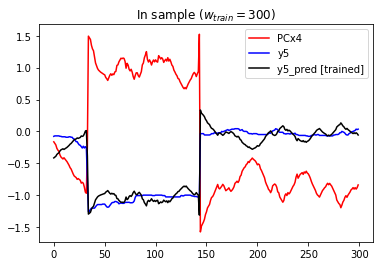

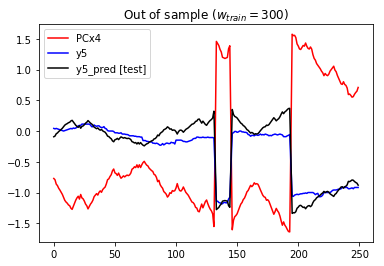

w_train = 350, [RMSE_train = 0.24; RMSE_test = 0.18], alpha = -0.42, beta = -0.48


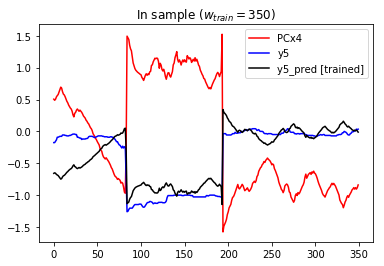

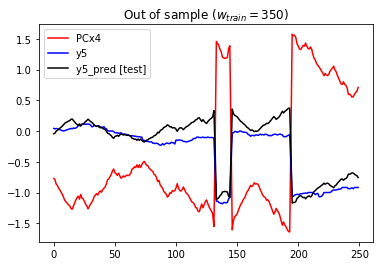

w_train = 400, [RMSE_train = 0.32; RMSE_test = 0.24], alpha = -0.33, beta = -0.47


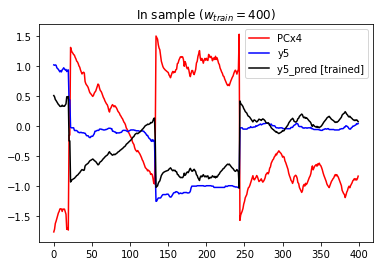

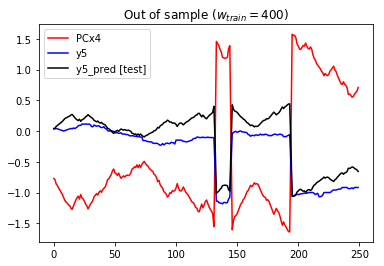

w_train = 450, [RMSE_train = 0.34; RMSE_test = 0.32], alpha = -0.28, beta = -0.54


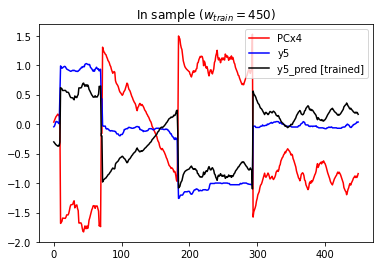

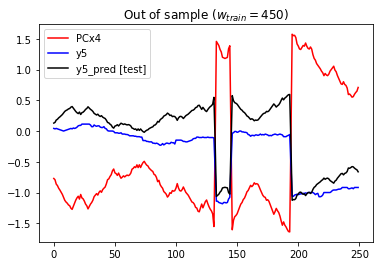

In [339]:
increasing_w_train = [250,300,350,400,450]

# loop over increasing w_train windows
for w in increasing_w_train:

    # loop over the y to be predicted
    for y_i in ['y5']:

        # loop over the singel PCs used as predictors in a linear regression model
        for PCx_j in ['PCx4']:

            # retrieve test series for training and prediction
            x_train, x_test, y_train, y_test = setTrainAndTestSeries(x=df_PCx,y=df_y,
                                                                     w_train=w,
                                                                     col_x=PCx_j,col_y=y_i)

            # run the linear regression and retrieve predicted y (both in- and out- of sample)
            linearModelFitted, y_train_pred, y_test_pred, RMSE_train, RMSE_test = runLinearModel(x_train, x_test, 
                                                                                                 y_train, y_test, 
                                                                                                 IO=False)
            
            print('w_train = {0:2d}, [RMSE_train = {1:.2f}; RMSE_test = {2:.2f}], alpha = {3:.2f}, beta = {4:.2f}'.format(w,
                                                                                                       RMSE_train, RMSE_test,
                                                                                                       linearModelFitted.params[0], 
                                                                                                       linearModelFitted.params[1]))

            # plot model predictions (in- and out- of sample, for comparison)
            plotModel(x_train, x_test, y_train, y_test, y_train_pred, y_test_pred,' ($w_{train} ='+str(w)+'$)',plotTest=True)


## Model 2: Multiple linear regression

Before revert to time-dependent $(\alpha, \beta)$, I try to understand whether all the PCs together, have a better predicting power. Therefore I fit the following multiple linear regression model:

$$
y_t = \alpha + \sum_{j=1}^6 \beta_j \cdot PCx_{j,t} + \epsilon
$$
performed for each $y_{i,t}$, $i=1,...,5$ over windows defined as before $[T_{train}-w_{train}:T_{train}]$ and tested over $[T_{train}:T_{train}+w_{test}]$ (default $w_{train}=w_{test}=250$).

In [555]:
def runMultipleLinearRegressionModel(x_train, x_test, y_train, y_test, IO=False):
    
    # Running the multiple linear regression
    multipleLinearModelFit = regression.linear_model.OLS(y_train, sm.add_constant(x_train)).fit()
    
    y_train_pred = multipleLinearModelFit.params[0] + x_train.mul(multipleLinearModelFit.params[1:]).sum(axis=1)
    y_train_pred.name = y_train.name + '_pred [trained]'

    y_test_pred = multipleLinearModelFit.params[0] + x_test.mul(multipleLinearModelFit.params[1:]).sum(axis=1)
    y_test_pred.name = y_test.name + '_pred [test]'
    
    RMSE_train = np.sqrt(np.mean((y_train_pred.values - y_train.values) ** 2))
    RMSE_test = np.sqrt(np.mean((y_test_pred.values - y_test.values) ** 2))
 
    if IO:
        print('RMSE in-sample = {0:.2f}'.format(RMSE_train))
        print('RMSE out-of-sample = {0:.2f}'.format(RMSE_test))
        print(multipleLinearModelFit.summary())

    return multipleLinearModelFit, y_train_pred, y_test_pred, RMSE_train, RMSE_test

RMSE in-sample = 0.07
RMSE out-of-sample = 0.29
                            OLS Regression Results                            
Dep. Variable:                     y1   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     2240.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.49e-209
Time:                        21:25:31   Log-Likelihood:                 309.78
No. Observations:                 250   AIC:                            -605.6
Df Residuals:                     243   BIC:                            -580.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

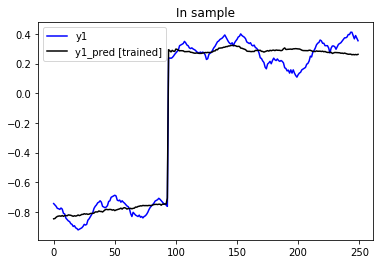

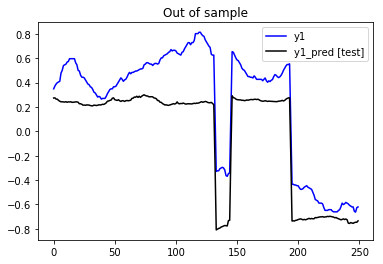

RMSE in-sample = 0.08
RMSE out-of-sample = 0.56
                            OLS Regression Results                            
Dep. Variable:                     y2   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     2510.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.84e-215
Time:                        21:25:31   Log-Likelihood:                 288.77
No. Observations:                 250   AIC:                            -563.5
Df Residuals:                     243   BIC:                            -538.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

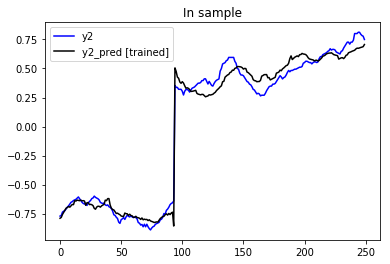

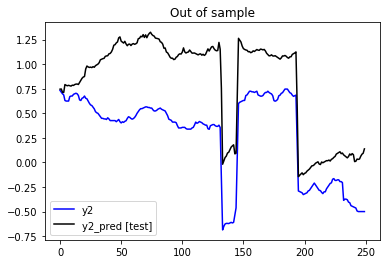

RMSE in-sample = 0.08
RMSE out-of-sample = 0.42
                            OLS Regression Results                            
Dep. Variable:                     y3   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                     1707.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.63e-195
Time:                        21:25:32   Log-Likelihood:                 275.77
No. Observations:                 250   AIC:                            -537.5
Df Residuals:                     243   BIC:                            -512.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

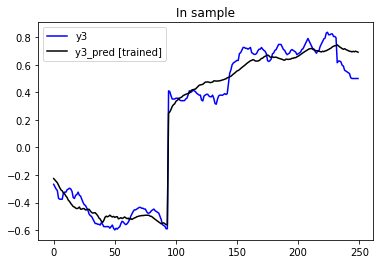

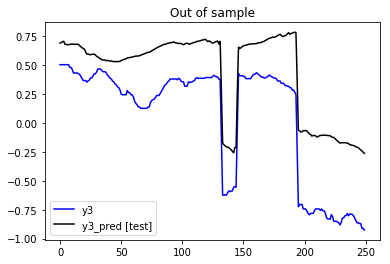

RMSE in-sample = 0.04
RMSE out-of-sample = 0.38
                            OLS Regression Results                            
Dep. Variable:                     y4   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     4312.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          1.17e-243
Time:                        21:25:33   Log-Likelihood:                 423.71
No. Observations:                 250   AIC:                            -833.4
Df Residuals:                     243   BIC:                            -808.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

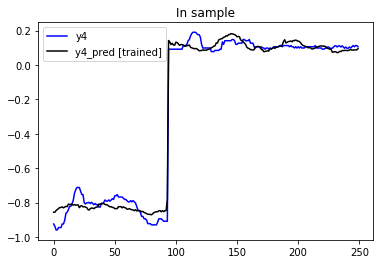

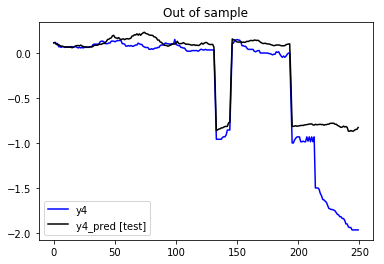

RMSE in-sample = 0.04
RMSE out-of-sample = 0.09
                            OLS Regression Results                            
Dep. Variable:                     y5   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     7519.
Date:                Mon, 27 Aug 2018   Prob (F-statistic):          8.82e-273
Time:                        21:25:33   Log-Likelihood:                 474.10
No. Observations:                 250   AIC:                            -934.2
Df Residuals:                     243   BIC:                            -909.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
cons

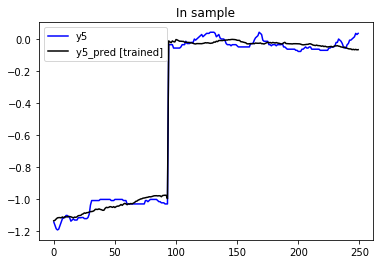

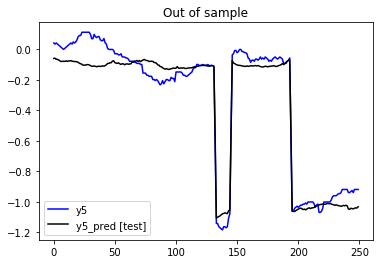

In [557]:
results = {}
results['Multiple Linear Regression'] = {}
results['Multiple Linear Regression']['Train'] = {}
results['Multiple Linear Regression']['Test'] = {}

# loop over the y to be predicted
for y_i in df_y.columns:
    
    results['Multiple Linear Regression']['Train'][y_i] = {} 
    results['Multiple Linear Regression']['Test'][y_i] = {} 

    # retrieve test series for training and prediction
    x_train, x_test, y_train, y_test = setTrainAndTestSeries(x=df_PCx,y=df_y, col_y=y_i)

    # run the multiple linear regression and retrieve predicted y (both in- and out- of sample)
    multipleLinearModelFitted, y_train_pred, y_test_pred, RMSE_train, RMSE_test = runMultipleLinearRegressionModel(x_train, x_test, 
                                                                                                                   y_train, y_test, 
                                                                                                                   IO=True)

    # plot model predictions (in- and out- of sample, for comparison)
    plotModel(x_train, x_test, y_train, y_test, y_train_pred, y_test_pred, plot_x=False)

    results['Multiple Linear Regression']['Train'][y_i] = RMSE_train
    results['Multiple Linear Regression']['Test'][y_i] = RMSE_test

trainResultMultipleLinearModel = pd.Series(results['Multiple Linear Regression']['Train'])
testResultMultipleLinearModel = pd.Series(results['Multiple Linear Regression']['Test'])
trainResultMultipleLinearModel.name='MLR'
testResultMultipleLinearModel.name='MLR'

As expected, despite the in-sample improvement, the MLR model doesn't outperform the single linear model in terms of predicting power. Moreover, usually all MLR betas are not significant, except the one linked to the best one-factor linear model.

In [558]:
trainResults = trainResultLinearModel.append(trainResultMultipleLinearModel)
testResults = testResultLinearModel.append(testResultMultipleLinearModel)

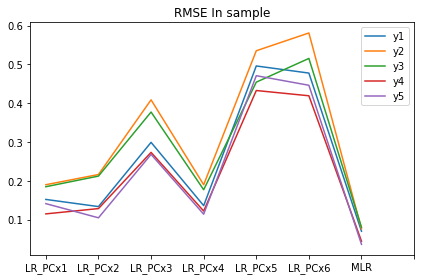

,y1,y2,y3,y4,y5
LR_PCx1,0.152051,0.189995,0.184832,0.114813,0.141190
LR_PCx2,0.133582,0.216253,0.212217,0.128466,0.104705
LR_PCx3,0.299190,0.408789,0.377306,0.273323,0.268133
LR_PCx4,0.136021,0.189945,0.177009,0.122126,0.114034
LR_PCx5,0.496102,0.535281,0.454352,0.432800,0.470991
LR_PCx6,0.477755,0.581159,0.515503,0.419247,0.446309
MLR,0.070084,0.076230,0.080298,0.044433,0.036322


In [559]:
ax=trainResults.plot()
ax.set_xticks(range(len(trainResults.index.values)+1))
ax.set_xticklabels(trainResults.index.values)
plt.title('RMSE In sample')
plt.tight_layout()
plt.show()

trainResults

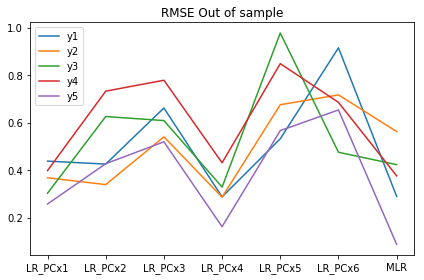

,y1,y2,y3,y4,y5
LR_PCx1,0.437942,0.367888,0.302783,0.398135,0.257347
LR_PCx2,0.425370,0.338904,0.625755,0.732607,0.426990
LR_PCx3,0.661684,0.540318,0.608685,0.778618,0.519273
LR_PCx4,0.287331,0.286109,0.328546,0.430902,0.161760
LR_PCx5,0.532020,0.675560,0.977715,0.848494,0.566461
LR_PCx6,0.915018,0.716783,0.475248,0.685394,0.653452
MLR,0.289490,0.562417,0.423087,0.375912,0.087440


In [560]:
ax=testResults.plot()
ax.set_xticks(range(len(testResults.index.values)))
ax.set_xticklabels(testResults.index.values)
plt.title('RMSE Out of sample')
plt.tight_layout()
plt.show()

testResults

## Model 3: Lasso linear regression

Before introducing the Kalman filter approach, let's forget for a moment the PCs time series and get back to the original Xs. As a model selection approach, the LASSO automatically selects the relevant beta. The loss minimized is ($N=70000$ in our sample):

$$
\frac{1}{2N} || y - \sum_{k=1}^{56} \beta_k x_{k} ||^2_2 + \lambda \sum_{k=1}^{56} |\beta_k|
$$
performed over windows defined as before $[T_{train}-w_{train}:T_{train}]$ and tested over $[T_{train}:T_{train}+w_{test}]$ (default $w_{train}=w_{test}=250$).

I decided to use the [LassoLarsCV](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LassoLarsCV.html) version of the Lasso algorithm which performs automatically a cross-validation to infer the optimal weight $\lambda$.

In [561]:
def runLassoRegressionModel(x_train, x_test, y_train, y_test, IO=False):
    
    # Running the LASSO  regression
    lassoModelFit = LassoLarsCV(cv=10).fit(x_train,y_train)
    
    y_train_pred = pd.Series(data=lassoModelFit.predict(x_train), index=y_train.index)
    y_train_pred.name = y_train.name + '_pred [trained]'

    y_test_pred = pd.Series(data=lassoModelFit.predict(x_test), index=y_test.index)
    y_test_pred.name = y_test.name + '_pred [test]'
    
    RMSE_train = np.sqrt(np.mean((y_train_pred.values - y_train.values) ** 2))
    RMSE_test = np.sqrt(np.mean((y_test_pred.values - y_test.values) ** 2))
 
    if IO:
        print('RMSE in-sample = {0:.2f}'.format(RMSE_train))
        print('RMSE out-of-sample = {0:.2f}'.format(RMSE_test))

    return lassoModelFit, y_train_pred, y_test_pred, RMSE_train, RMSE_test

RMSE in-sample = 0.07
RMSE out-of-sample = 0.25


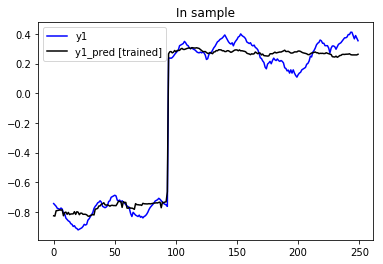

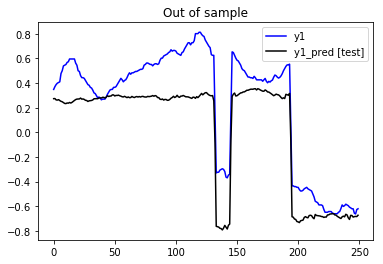

RMSE in-sample = 0.24
RMSE out-of-sample = 0.19


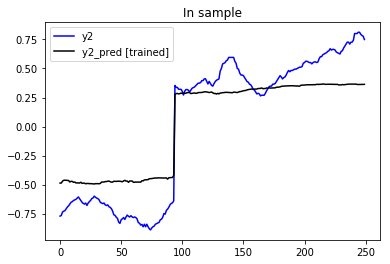

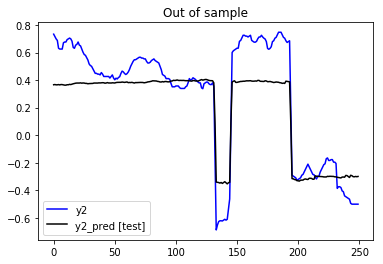

RMSE in-sample = 0.31
RMSE out-of-sample = 0.43


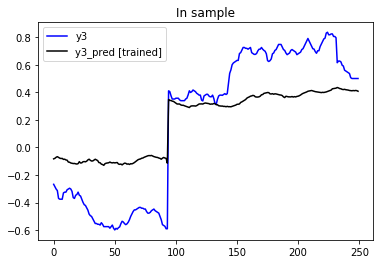

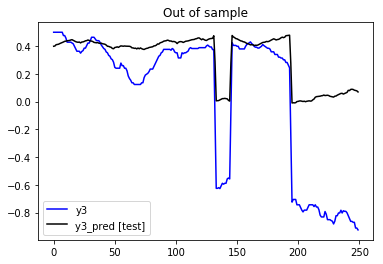

RMSE in-sample = 0.04
RMSE out-of-sample = 0.36


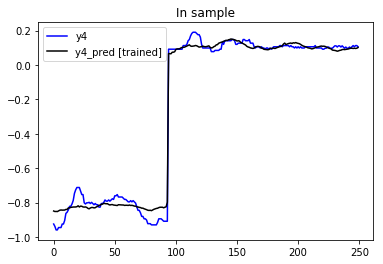

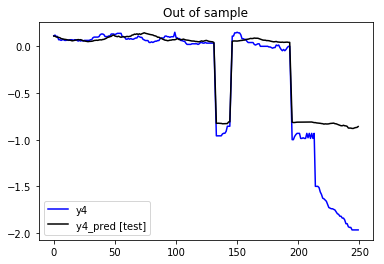

RMSE in-sample = 0.04
RMSE out-of-sample = 0.10


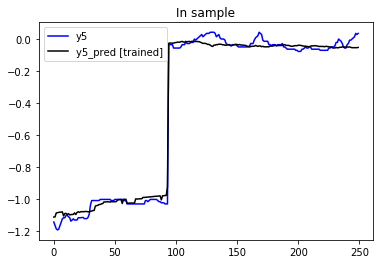

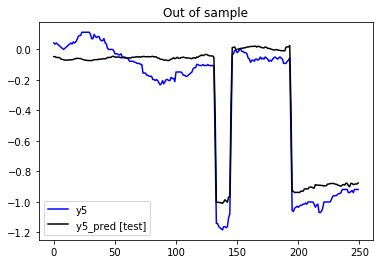

In [562]:
warnings.filterwarnings("ignore")

results = {}
results['Lasso Regression'] = {}
results['Lasso Regression']['Train'] = {}
results['Lasso Regression']['Test'] = {}

# loop over the y to be predicted
for y_i in df_y.columns:
    
    results['Lasso Regression']['Train'][y_i] = {} 
    results['Lasso Regression']['Test'][y_i] = {} 

    # retrieve test series for training and prediction
    x_train, x_test, y_train, y_test = setTrainAndTestSeries(x=df_x,y=df_y, col_y=y_i)

    # run the multiple linear regression and retrieve predicted y (both in- and out- of sample)
    lassoModelFitted, y_train_pred, y_test_pred, RMSE_train, RMSE_test = runLassoRegressionModel(x_train, x_test, 
                                                                                                 y_train, y_test, 
                                                                                                 IO=True)

    # plot model predictions (in- and out- of sample, for comparison)
    plotModel(x_train, x_test, y_train, y_test, y_train_pred, y_test_pred, plot_x=False)

    results['Lasso Regression']['Train'][y_i] = RMSE_train
    results['Lasso Regression']['Test'][y_i] = RMSE_test

trainResultLassoModel = pd.Series(results['Lasso Regression']['Train'])
testResultLassoModel = pd.Series(results['Lasso Regression']['Test'])
trainResultLassoModel.name='Lasso'
testResultLassoModel.name='Lasso'

Results of the Lasso algorithm are not substantially different from those obtained with the MLR or even with the best single PCx model for the given y.

In [563]:
trainResults = trainResults.append(trainResultLassoModel)
testResults = testResults.append(testResultLassoModel)

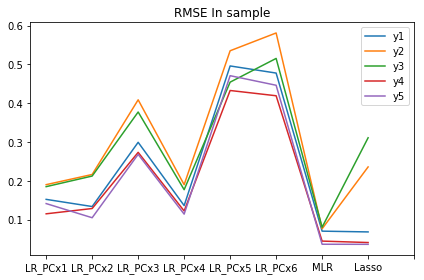

,y1,y2,y3,y4,y5
LR_PCx1,0.152051,0.189995,0.184832,0.114813,0.141190
LR_PCx2,0.133582,0.216253,0.212217,0.128466,0.104705
LR_PCx3,0.299190,0.408789,0.377306,0.273323,0.268133
LR_PCx4,0.136021,0.189945,0.177009,0.122126,0.114034
LR_PCx5,0.496102,0.535281,0.454352,0.432800,0.470991
LR_PCx6,0.477755,0.581159,0.515503,0.419247,0.446309
MLR,0.070084,0.076230,0.080298,0.044433,0.036322
Lasso,0.068102,0.235692,0.310884,0.040744,0.036117


In [564]:
ax=trainResults.plot()
ax.set_xticks(range(len(trainResults.index.values)+1))
ax.set_xticklabels(trainResults.index.values)
plt.title('RMSE In sample')
plt.tight_layout()
plt.show()

trainResults

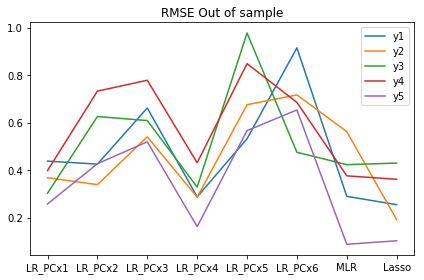

,y1,y2,y3,y4,y5
LR_PCx1,0.437942,0.367888,0.302783,0.398135,0.257347
LR_PCx2,0.425370,0.338904,0.625755,0.732607,0.426990
LR_PCx3,0.661684,0.540318,0.608685,0.778618,0.519273
LR_PCx4,0.287331,0.286109,0.328546,0.430902,0.161760
LR_PCx5,0.532020,0.675560,0.977715,0.848494,0.566461
LR_PCx6,0.915018,0.716783,0.475248,0.685394,0.653452
MLR,0.289490,0.562417,0.423087,0.375912,0.087440
Lasso,0.254450,0.191252,0.429687,0.361414,0.102481


In [565]:
ax=testResults.plot()
ax.set_xticks(range(len(testResults.index.values)))
ax.set_xticklabels(testResults.index.values)
plt.title('RMSE Out of sample')
plt.tight_layout()
plt.show()

testResults

The LASSO algorithm finds optimal to include 6 Xs as regressors. 

Here is the path of the $\beta_k$, when varying the weight $\lambda$ (here, plotted up to the optimal $\lambda \simeq 8 \times 10^{-4}$ )

In [513]:
print('lambda={0:.4f}'.format(lassoModelFitted.alpha_))

lambda=0.0008


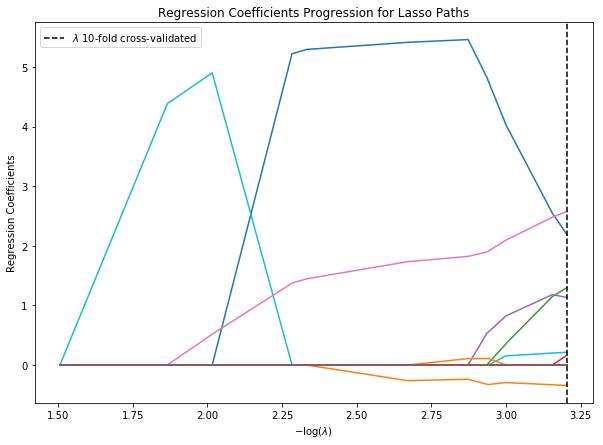

In [502]:
m_log_lambdas = -np.log10(lassoModelFitted.alphas_)

fig = plt.figure(figsize=(10,7))
ax = plt.gca()
plt.plot(m_log_lambdas, lassoModelFitted.coef_path_.T)
plt.axvline(-np.log10(lassoModelFitted.alpha_), linestyle='--', color='k', label='$\lambda$ 10-fold cross-validated')
plt.ylabel('Regression Coefficients')
plt.xlabel('$-\log(\lambda)$')
plt.title('Regression Coefficients Progression for Lasso Paths')
plt.legend()
plt.show()

Here I show the coefficients $\beta_k$ assigned to each $x_k$ $k=1, \dots, 56$ and below, the corresponding $x_k$ in the training set.

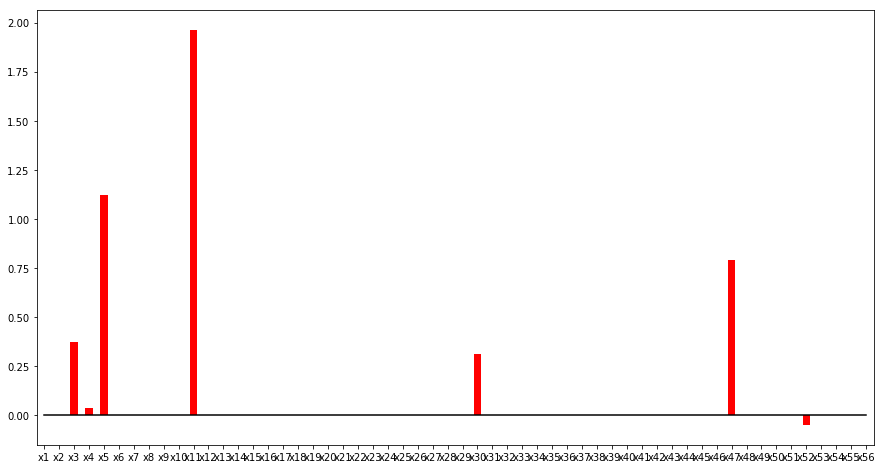

In [504]:
fig = plt.figure(figsize=(15,8))
pd.Series(data=lassoModelFitted.coef_, index=df_x.columns).plot('bar', color='r')
pd.Series(data=0.0*lassoModelFitted.coef_, index=df_x.columns).plot(color='k')
plt.show()

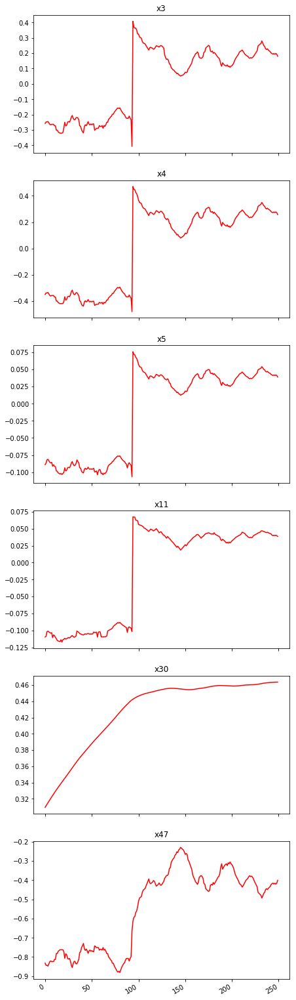

In [505]:
beta_k = pd.Series(data=lassoModelFitted.coef_, index=df_x.columns)
x_k = x_train.loc[:,beta_k[beta_k > 0].index]
x_k.plot(subplots=True, figsize=(7,5*6), legend=False, title=list(x_k.columns), color='r')
plt.show()

## Model 4: Kalman filter

We compute time-varying estimates of (alpha, beta) following:
- Bos, T. and Newbold, P. (1984). "An empirical investigation of the possibility of stochastic systematic risk in the market model.
- Tutorial on python implementation: http://www.thealgoengineer.com/2014/online_linear_regression_kalman_filter/

### Model 4.1: Kalman filter with initial guesses and prediction based on last state vector values

In [694]:
def runKalmanFilterModel(x_train, x_test, y_train, y_test, IO=False, optimized=False, online_prediction=False):

    # define the observation matrix when (beta, alpha) is the state vector
    obs_mat = np.expand_dims(np.vstack([[x_train], [np.ones(len(x_train))]]).T, axis=1)

    if optimized:
        kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, # y is 1-dimensional, (alpha, beta) is 2-dimensional
                          transition_matrices=np.eye(2),
                          observation_matrices=obs_mat)
        
        # performs 10 EM algorithm iterations to optimize the covariances and initial guesses 
        # (the number of iterations is kept to 1 to avoid, as much as possible, overfitting of the training set)
        kf.em(y_train.values, n_iter=1, em_vars=['transition_covariance',
                                                  'observation_covariance',
                                                  'initial_state_mean', 
                                                  'initial_state_covariance'])
    else:
        
        # define the noises in observations
        delta = 1e-3
        trans_cov = delta / (1 - delta) * np.eye(2) # How much random walk wiggles
        
        kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, # y is 1-dimensional, (alpha, beta) is 2-dimensional
                          initial_state_mean=[0,0],
                          initial_state_covariance=np.ones((2, 2)),
                          transition_matrices=np.eye(2),
                          observation_matrices=obs_mat,
                          observation_covariance=1.0,
                          transition_covariance=trans_cov)    
    
    # Use the observations y to get running estimates and errors for the state parameters
    state_means, state_covs = kf.filter(y_train.values)

    # filtered (beta, alpha) state 
    alpha = state_means[:,1]
    beta = state_means[:,0]
    
    y_train_pred = alpha + beta*x_train
    y_train_pred.name = y_train.name + '_pred [trained]'
    
    if online_prediction:
        
        y_test_pred = pd.Series(index=y_test.index)
        
        # initialize the state to be updated to the last filtered in training
        estimated_state_mean, estimated_state_covs = state_means[-1], state_covs[-1]
        
        # loop over the test set - BUT I'M USING ONLY THE X!
        for t in x_test.index:
            
            # we make a NOISY guess y_{t} | info up to t-1, given:
            # the estimate (beta, alpha)_{t-1}
            # x_t
            lag=5
            if t < lag:
                if t == 0:
                    y_t_guess = y_train.tail(lag).values.mean()
                else:
                    pass # y_t_guess not updated in the first lag steps
            else:
                y_t_guess = y_test[t-lag:t].mean() # Note well: y_t is not included in the averaging
            #y_t_guess = estimated_state_mean[1] + estimated_state_mean[0]*x_test[t] # exact KF forecast, tauthologic            
            #y_t_guess = estimated_state_mean[1] + estimated_state_mean[0]*x_test[t] + np.random.randn() # with same observation noise

            #print('y_t_guess = ', y_t_guess)
            #print('alpha_old = ', estimated_state_mean[1])
            #print('beta_old = ', estimated_state_mean[0])
            
            # Compute the estimate: (beta, alpha)_t of the state for time t, given:
            # the estimate (beta, alpha)_{t-1}
            # the guess: y_{t} | info up to t-1
            # x_t
            estimated_state_mean, estimated_state_covs = kf.filter_update(filtered_state_mean=estimated_state_mean, 
                                                                          filtered_state_covariance=estimated_state_covs,
                                                                          observation=y_t_guess,
                                                                          observation_matrix=np.array([[x_test[t],1.0]]))
            
            #print('alpha_new = ', estimated_state_mean[1])
            #print('beta_new = ', estimated_state_mean[0])
            
            # given x_t and the estimate (beta, alpha)_t just computed, 
            # make the prediction for y_t
            y_test_pred[t] = estimated_state_mean[1] + estimated_state_mean[0]*x_test[t]
            #print('y_test_pred = ', y_test_pred[t])
            
                                                      
    else:
    
        # for out-of-sample prediction use the last filtered value of the (beta, alpha) state
        y_test_pred = alpha[-1] + beta[-1]*x_test
    
    y_test_pred.name = y_test.name + '_pred [test]'
    
    RMSE_train = np.sqrt(np.mean((y_train_pred.values - y_train.values) ** 2))
    RMSE_test = np.sqrt(np.mean((y_test_pred.values - y_test.values) ** 2))
 
    if IO:
        print('RMSE in-sample = {0:.2f}'.format(RMSE_train))
        print('RMSE out-of-sample = {0:.2f}'.format(RMSE_test))

    return kf, y_train_pred, y_test_pred, RMSE_train, RMSE_test, alpha, beta

RMSE in-sample = 0.29
RMSE out-of-sample = 0.33


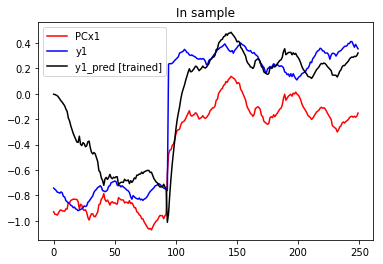

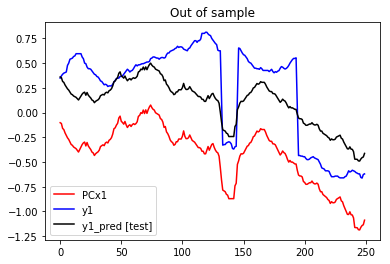

RMSE in-sample = 0.18
RMSE out-of-sample = 0.45


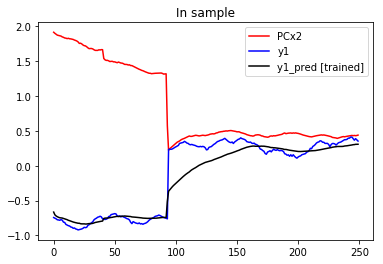

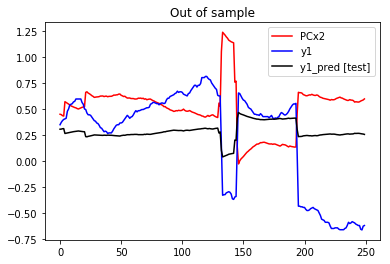

RMSE in-sample = 0.19
RMSE out-of-sample = 0.58


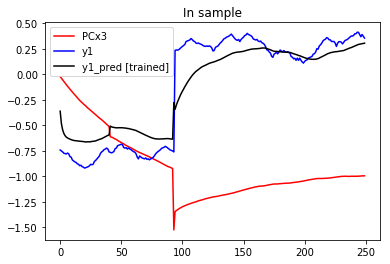

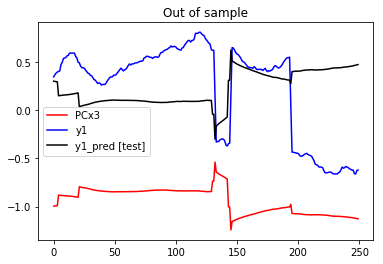

RMSE in-sample = 0.12
RMSE out-of-sample = 0.23


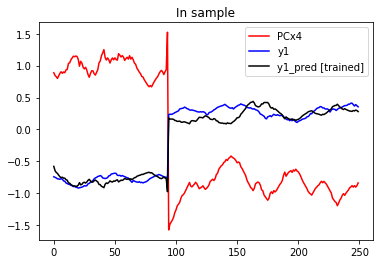

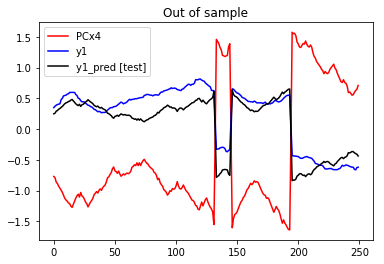

RMSE in-sample = 0.27
RMSE out-of-sample = 0.50


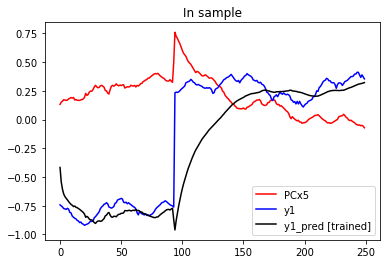

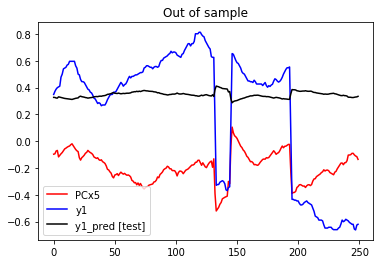

RMSE in-sample = 0.24
RMSE out-of-sample = 0.46


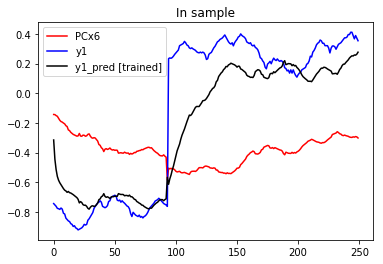

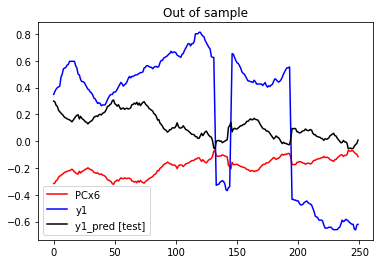

RMSE in-sample = 0.27
RMSE out-of-sample = 0.27


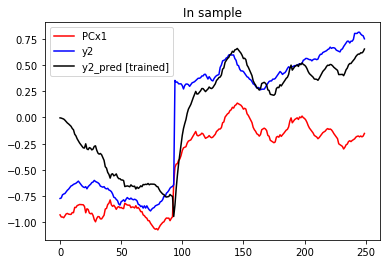

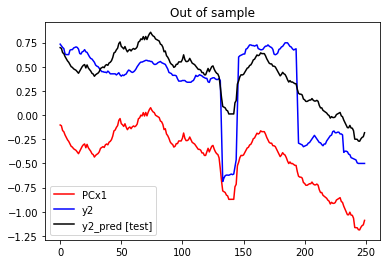

RMSE in-sample = 0.21
RMSE out-of-sample = 0.52


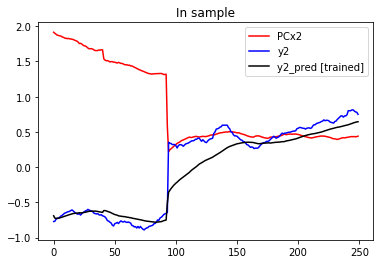

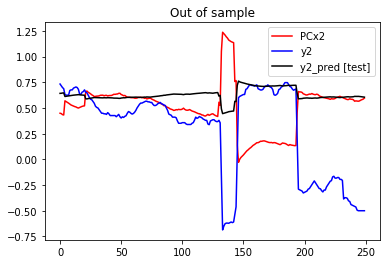

RMSE in-sample = 0.22
RMSE out-of-sample = 0.57


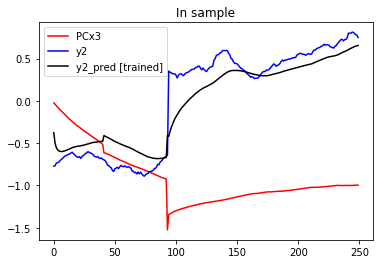

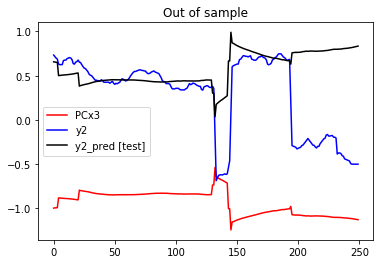

RMSE in-sample = 0.15
RMSE out-of-sample = 0.26


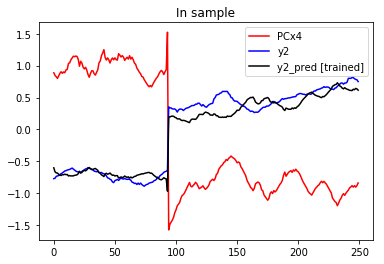

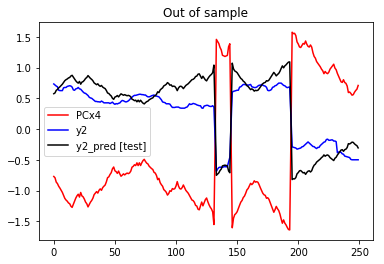

RMSE in-sample = 0.29
RMSE out-of-sample = 0.59


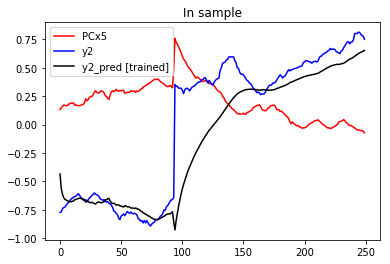

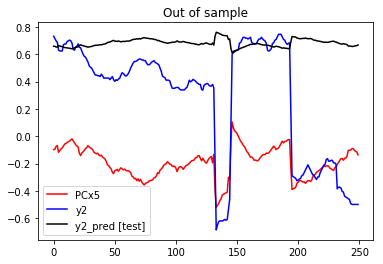

RMSE in-sample = 0.27
RMSE out-of-sample = 0.42


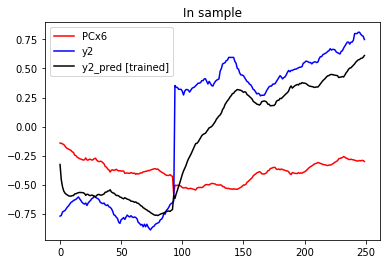

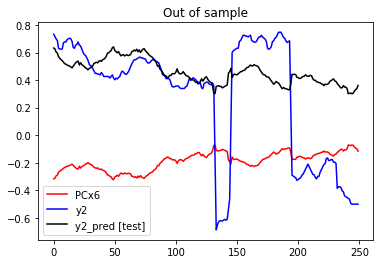

RMSE in-sample = 0.20
RMSE out-of-sample = 0.52


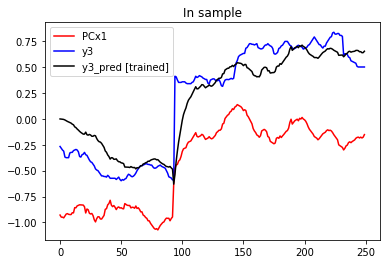

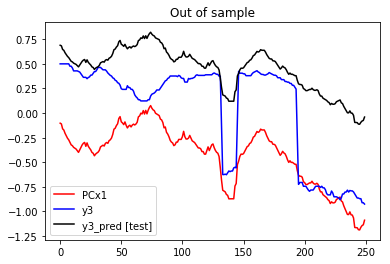

RMSE in-sample = 0.19
RMSE out-of-sample = 0.76


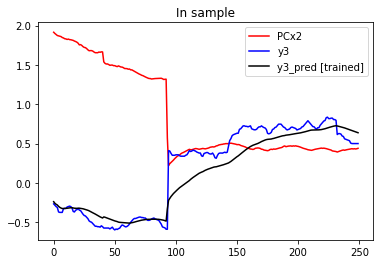

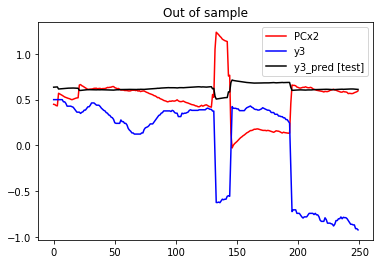

RMSE in-sample = 0.19
RMSE out-of-sample = 0.77


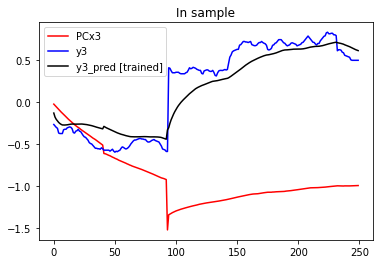

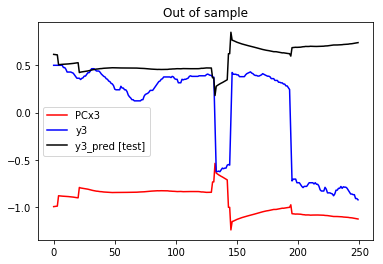

RMSE in-sample = 0.13
RMSE out-of-sample = 0.38


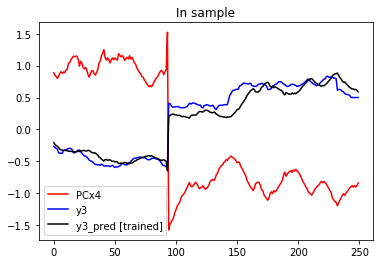

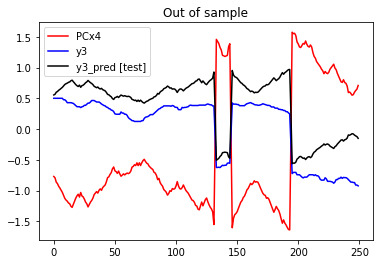

RMSE in-sample = 0.25
RMSE out-of-sample = 0.79


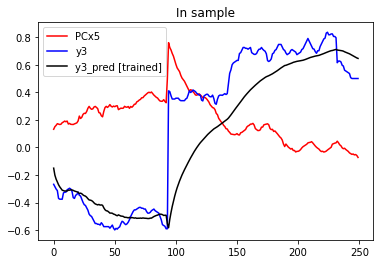

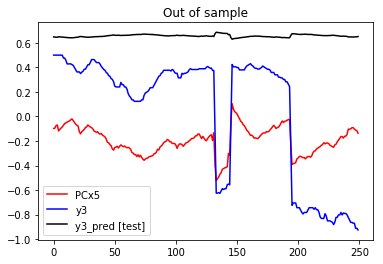

RMSE in-sample = 0.24
RMSE out-of-sample = 0.67


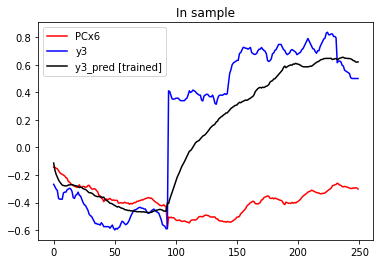

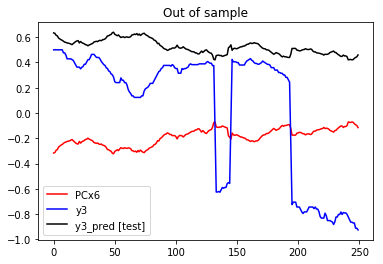

RMSE in-sample = 0.29
RMSE out-of-sample = 0.54


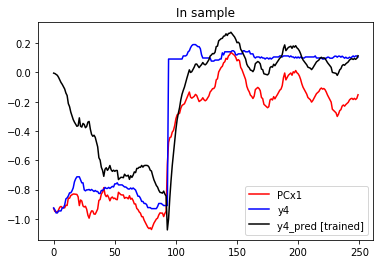

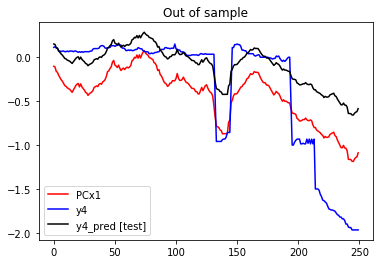

RMSE in-sample = 0.15
RMSE out-of-sample = 0.77


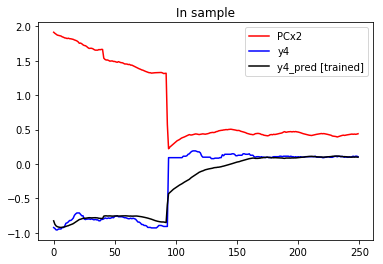

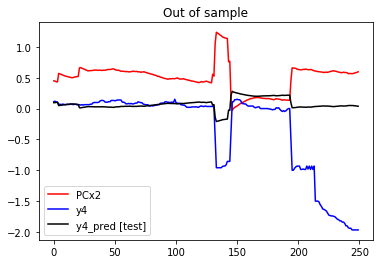

RMSE in-sample = 0.18
RMSE out-of-sample = 0.85


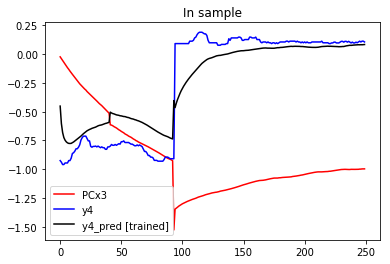

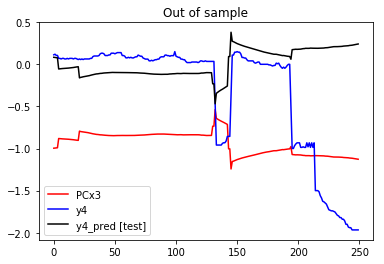

RMSE in-sample = 0.10
RMSE out-of-sample = 0.47


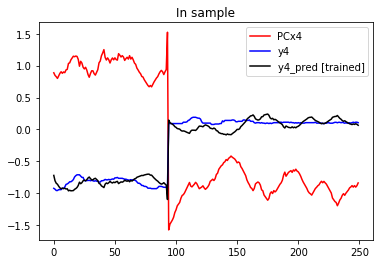

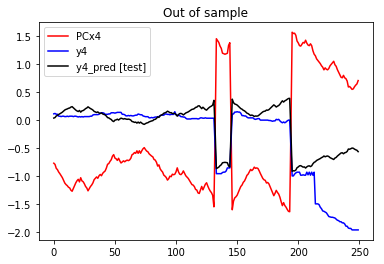

RMSE in-sample = 0.25
RMSE out-of-sample = 0.84


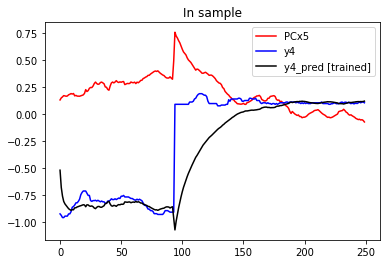

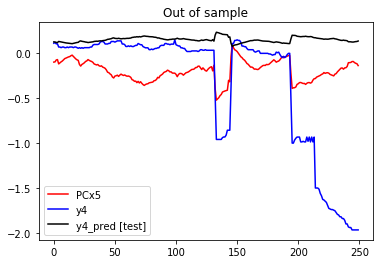

RMSE in-sample = 0.22
RMSE out-of-sample = 0.68


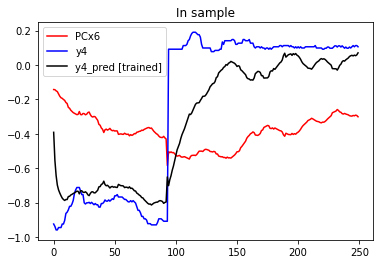

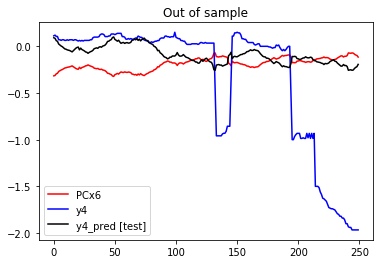

RMSE in-sample = 0.36
RMSE out-of-sample = 0.30


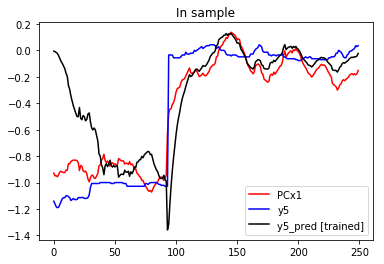

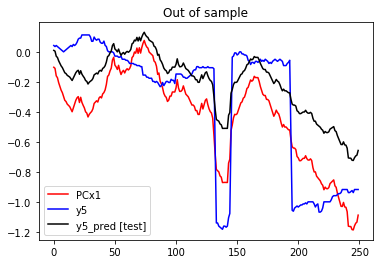

RMSE in-sample = 0.14
RMSE out-of-sample = 0.47


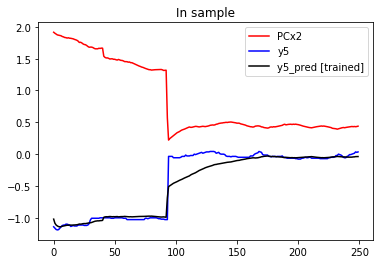

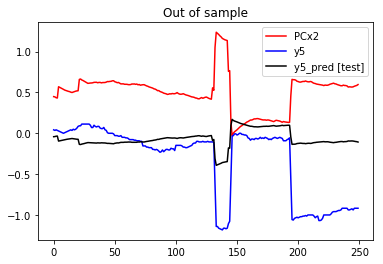

RMSE in-sample = 0.19
RMSE out-of-sample = 0.56


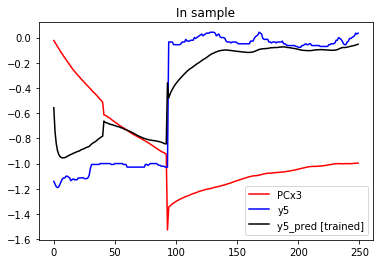

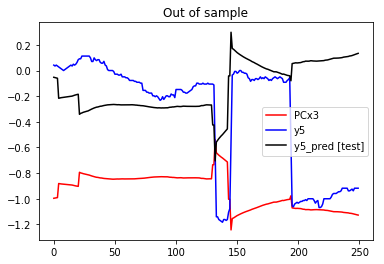

RMSE in-sample = 0.09
RMSE out-of-sample = 0.15


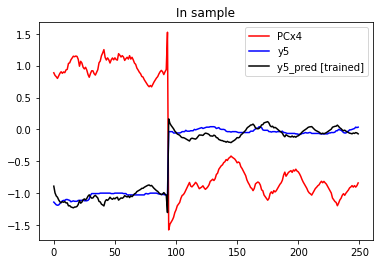

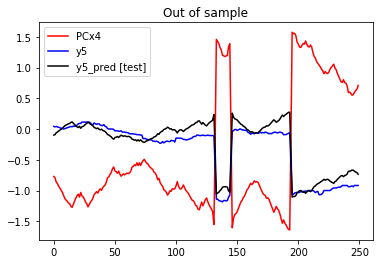

RMSE in-sample = 0.26
RMSE out-of-sample = 0.58


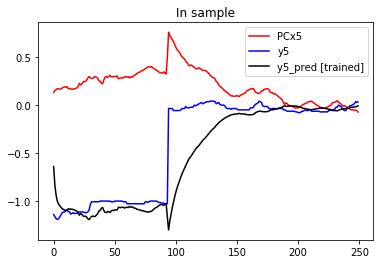

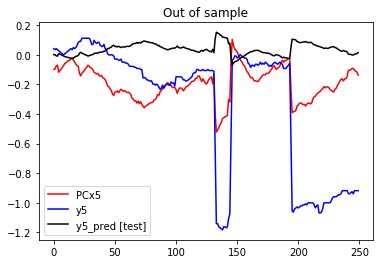

RMSE in-sample = 0.22
RMSE out-of-sample = 0.38


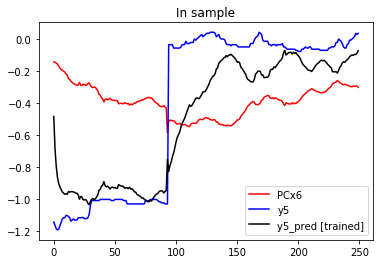

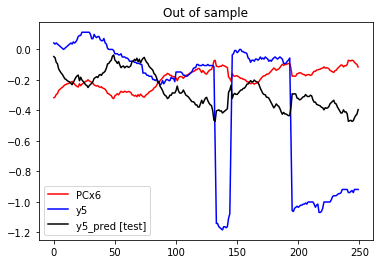

In [567]:
results = {}
results['Kalman Filter'] = {}
results['Kalman Filter']['Train'] = {}
results['Kalman Filter']['Test'] = {}

# loop over the y to be predicted
for y_i in df_y.columns:
    
    results['Kalman Filter']['Train'][y_i] = {} 
    results['Kalman Filter']['Test'][y_i] = {} 
    
    # loop over the singel PCs used as predictors in a linear regression model
    for PCx_j in df_PCx.columns:
        
        # retrieve test series for training and prediction
        x_train, x_test, y_train, y_test = setTrainAndTestSeries(x=df_PCx,y=df_y,
                                                                 col_x=PCx_j,col_y=y_i)
        
        # run the linear regression and retrieve predicted y (both in- and out- of sample)
        KFModelFitted, y_train_pred, y_test_pred, RMSE_train, RMSE_test, _, _ = runKalmanFilterModel(x_train, x_test, 
                                                                                                     y_train, y_test, 
                                                                                                     IO=True)
        
        # plot model predictions (in- and out- of sample, for comparison)
        plotModel(x_train, x_test, y_train, y_test, y_train_pred, y_test_pred)
        
        results['Kalman Filter']['Train'][y_i]['KF_'+PCx_j] = RMSE_train
        results['Kalman Filter']['Test'][y_i]['KF_'+PCx_j] = RMSE_test

trainResultKFModel = pd.DataFrame(results['Kalman Filter']['Train'])
testResultKFModel = pd.DataFrame(results['Kalman Filter']['Test'])
trainResultKFModel.name = 'KF'
testResultKFModel.name = 'KF'

In [569]:
trainResults = trainResults.append(trainResultKFModel)
testResults = testResults.append(testResultKFModel)

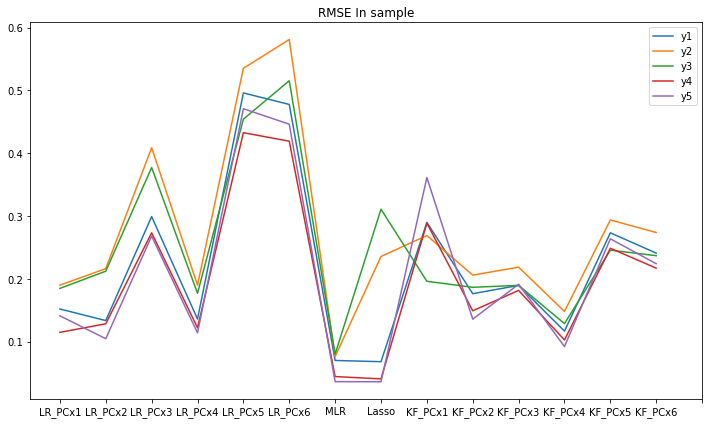

,y1,y2,y3,y4,y5
LR_PCx1,0.152051,0.189995,0.184832,0.114813,0.141190
LR_PCx2,0.133582,0.216253,0.212217,0.128466,0.104705
LR_PCx3,0.299190,0.408789,0.377306,0.273323,0.268133
LR_PCx4,0.136021,0.189945,0.177009,0.122126,0.114034
LR_PCx5,0.496102,0.535281,0.454352,0.432800,0.470991
LR_PCx6,0.477755,0.581159,0.515503,0.419247,0.446309
MLR,0.070084,0.076230,0.080298,0.044433,0.036322
Lasso,0.068102,0.235692,0.310884,0.040744,0.036117
KF_PCx1,0.289935,0.269008,0.196185,0.288686,0.361297
KF_PCx2,0.176399,0.205967,0.186587,0.149158,0.135770


In [585]:
ax=trainResults.plot(figsize=(10,6))
ax.set_xticks(range(len(trainResults.index.values)+1))
ax.set_xticklabels(trainResults.index.values)
plt.title('RMSE In sample')
plt.tight_layout()
plt.show()

trainResults

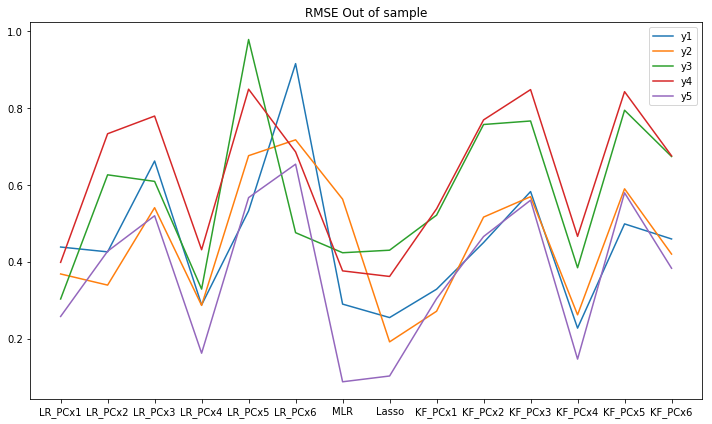

,y1,y2,y3,y4,y5
LR_PCx1,0.437942,0.367888,0.302783,0.398135,0.257347
LR_PCx2,0.425370,0.338904,0.625755,0.732607,0.426990
LR_PCx3,0.661684,0.540318,0.608685,0.778618,0.519273
LR_PCx4,0.287331,0.286109,0.328546,0.430902,0.161760
LR_PCx5,0.532020,0.675560,0.977715,0.848494,0.566461
LR_PCx6,0.915018,0.716783,0.475248,0.685394,0.653452
MLR,0.289490,0.562417,0.423087,0.375912,0.087440
Lasso,0.254450,0.191252,0.429687,0.361414,0.102481
KF_PCx1,0.328219,0.270949,0.520914,0.537374,0.303672
KF_PCx2,0.449613,0.515790,0.756666,0.768613,0.465263


In [584]:
ax = testResults.plot(figsize=(10,6))
ax.set_xticks(range(len(testResults.index.values)))
ax.set_xticklabels(testResults.index.values)
plt.title('RMSE Out of sample')
plt.tight_layout()
plt.show()

testResults

### Model 4.2: Kalman filter with optimized parameters and prediction based on last state vector values

DESCRIPTION

This model is clearly overfitting the training set, even if the number of iterations of the EM algorithm is just 1.ù

RMSE in-sample = 0.02
RMSE out-of-sample = 0.45


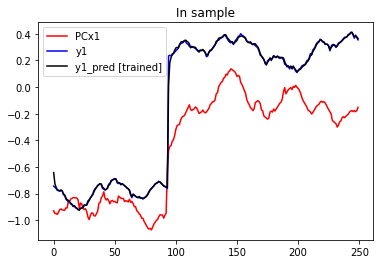

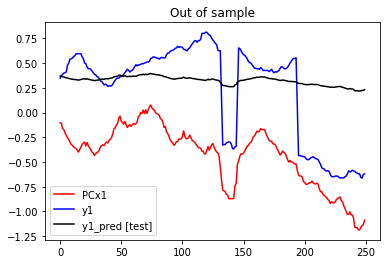

RMSE in-sample = 0.02
RMSE out-of-sample = 0.44


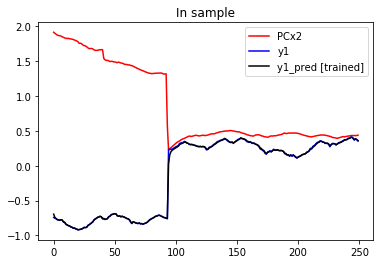

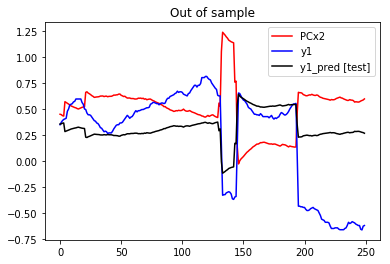

RMSE in-sample = 0.02
RMSE out-of-sample = 0.53


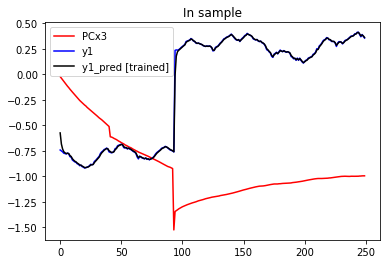

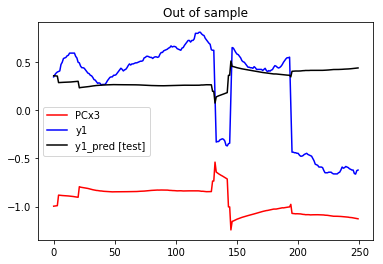

RMSE in-sample = 0.01
RMSE out-of-sample = 0.41


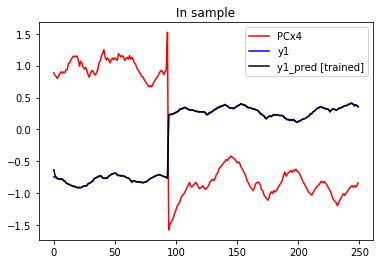

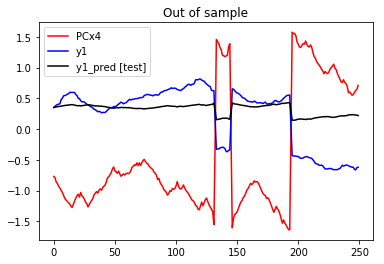

RMSE in-sample = 0.02
RMSE out-of-sample = 0.46


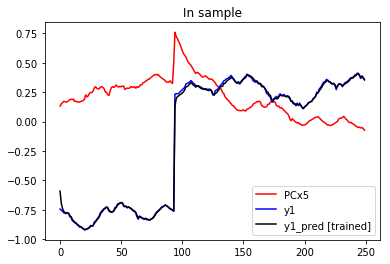

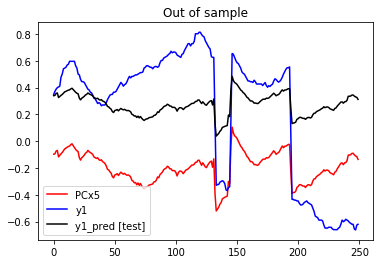

RMSE in-sample = 0.02
RMSE out-of-sample = 0.50


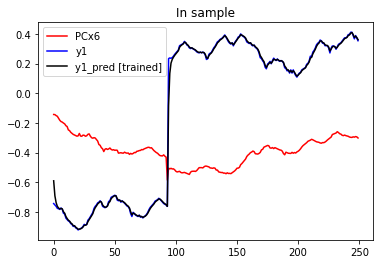

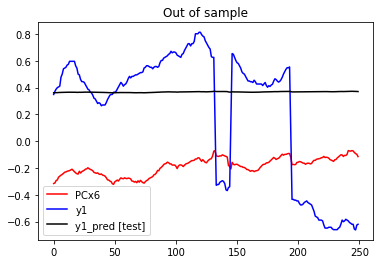

RMSE in-sample = 0.02
RMSE out-of-sample = 0.53


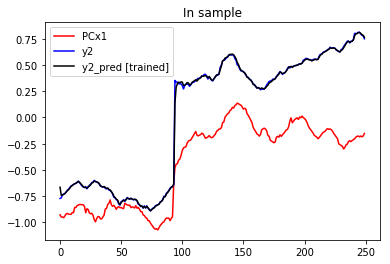

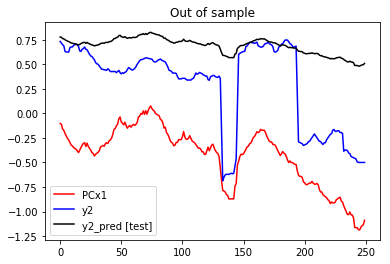

RMSE in-sample = 0.02
RMSE out-of-sample = 0.57


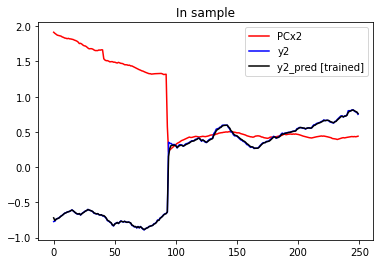

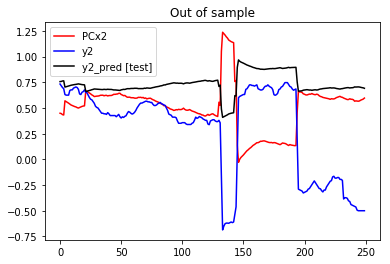

RMSE in-sample = 0.02
RMSE out-of-sample = 0.62


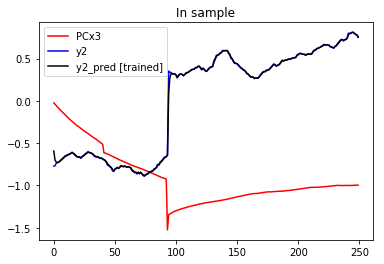

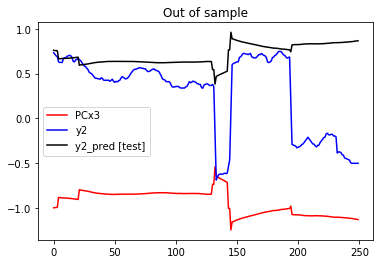

RMSE in-sample = 0.01
RMSE out-of-sample = 0.56


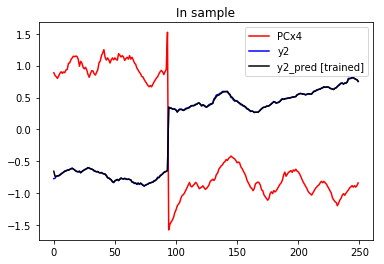

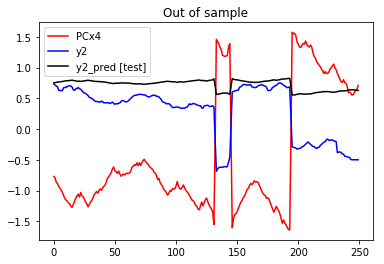

RMSE in-sample = 0.02
RMSE out-of-sample = 0.57


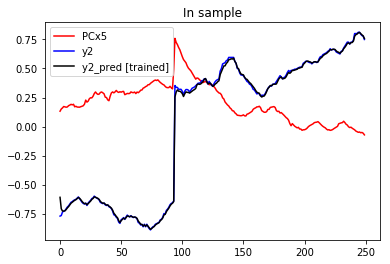

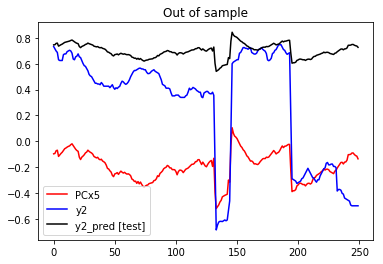

RMSE in-sample = 0.02
RMSE out-of-sample = 0.61


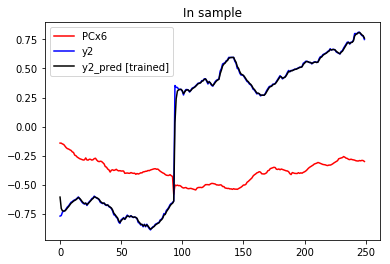

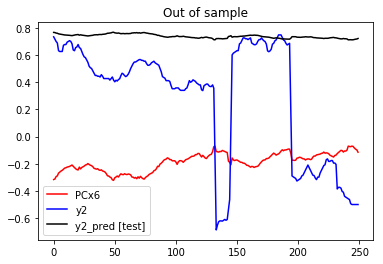

RMSE in-sample = 0.02
RMSE out-of-sample = 0.61


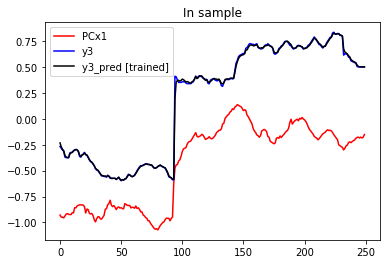

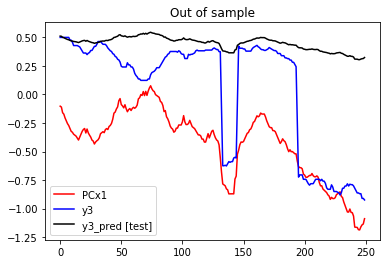

RMSE in-sample = 0.02
RMSE out-of-sample = 0.61


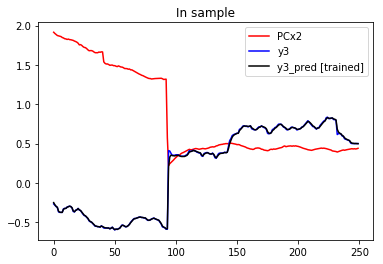

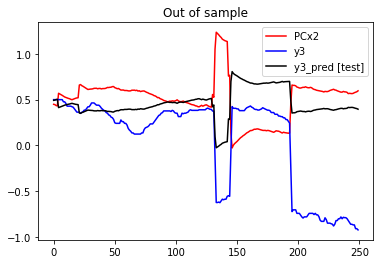

RMSE in-sample = 0.02
RMSE out-of-sample = 0.68


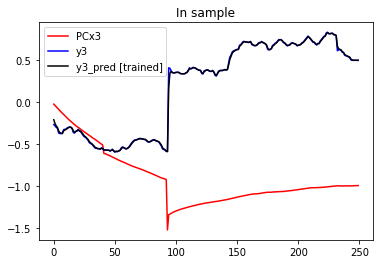

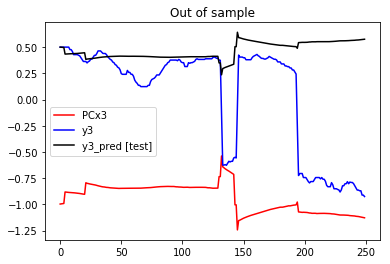

RMSE in-sample = 0.01
RMSE out-of-sample = 0.73


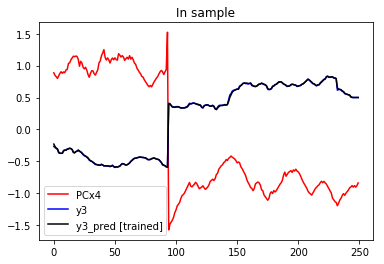

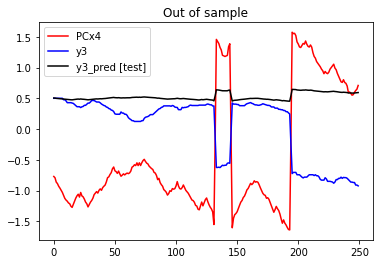

RMSE in-sample = 0.01
RMSE out-of-sample = 0.59


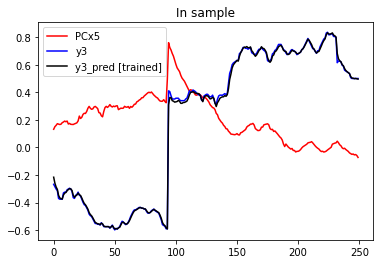

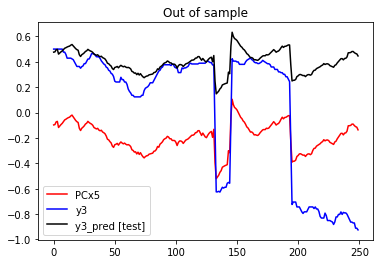

RMSE in-sample = 0.02
RMSE out-of-sample = 0.69


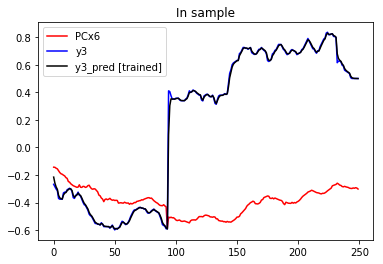

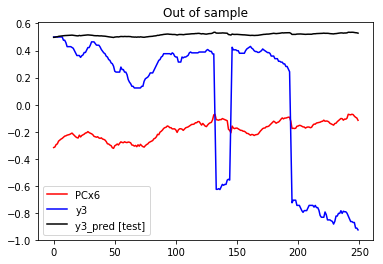

RMSE in-sample = 0.02
RMSE out-of-sample = 0.77


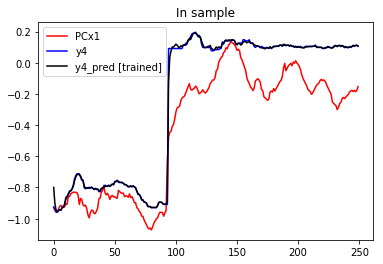

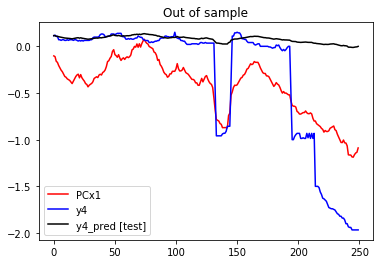

RMSE in-sample = 0.01
RMSE out-of-sample = 0.75


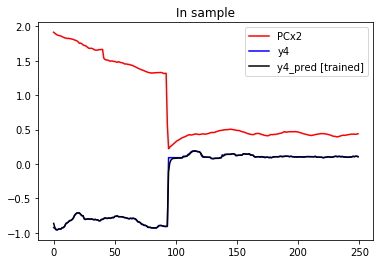

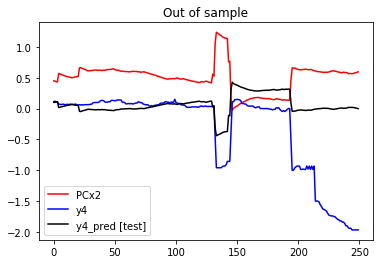

RMSE in-sample = 0.02
RMSE out-of-sample = 0.83


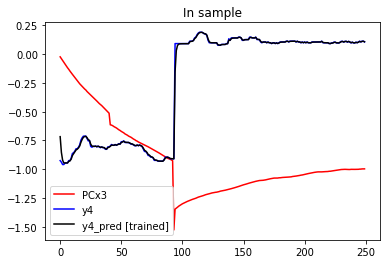

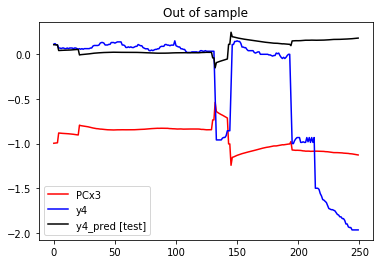

RMSE in-sample = 0.01
RMSE out-of-sample = 0.76


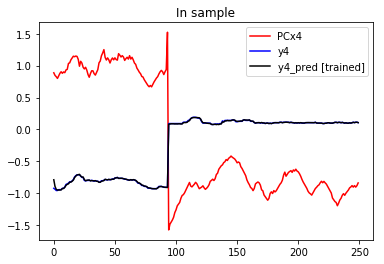

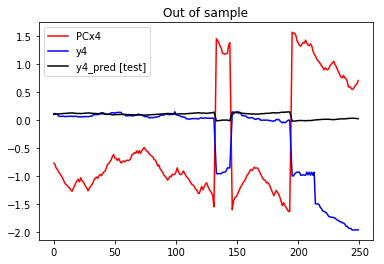

RMSE in-sample = 0.02
RMSE out-of-sample = 0.74


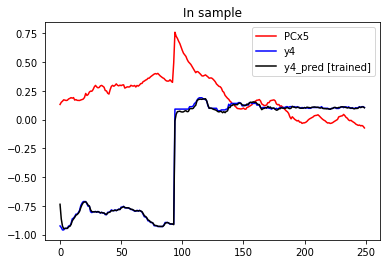

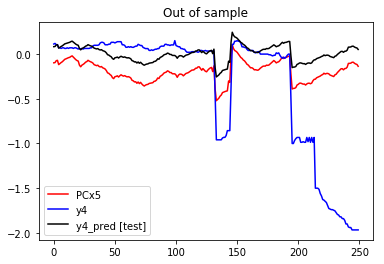

RMSE in-sample = 0.03
RMSE out-of-sample = 0.82


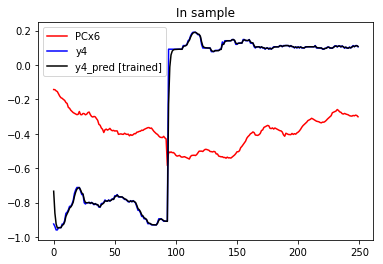

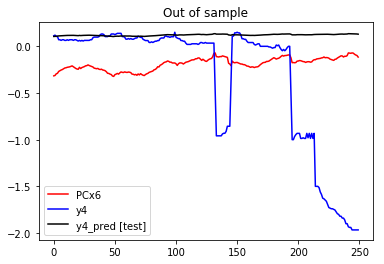

RMSE in-sample = 0.02
RMSE out-of-sample = 0.54


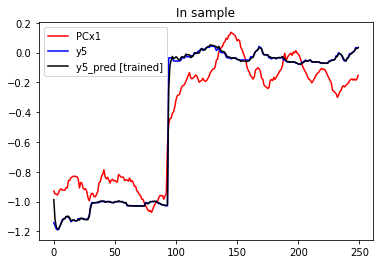

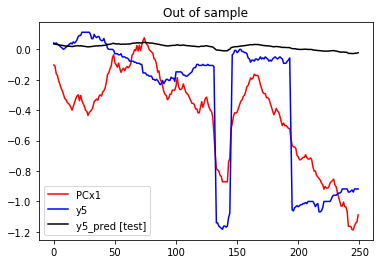

RMSE in-sample = 0.01
RMSE out-of-sample = 0.48


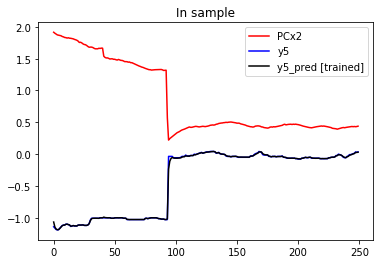

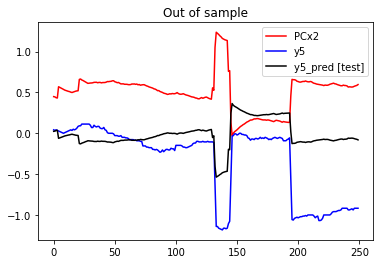

RMSE in-sample = 0.02
RMSE out-of-sample = 0.56


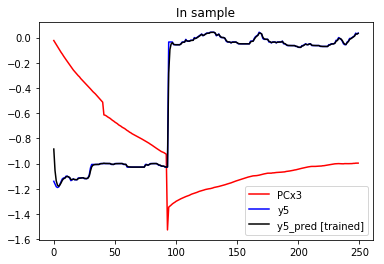

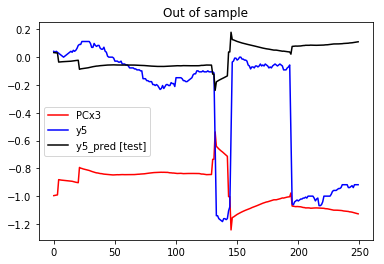

RMSE in-sample = 0.01
RMSE out-of-sample = 0.45


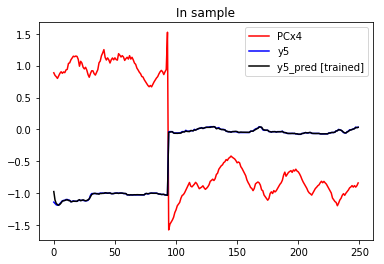

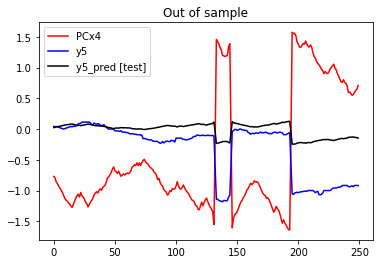

RMSE in-sample = 0.02
RMSE out-of-sample = 0.46


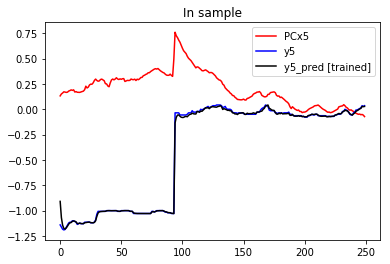

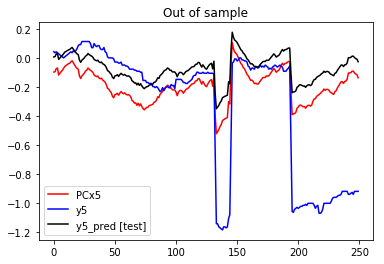

RMSE in-sample = 0.03
RMSE out-of-sample = 0.58


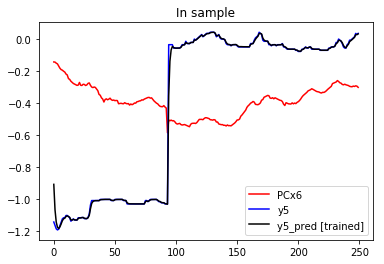

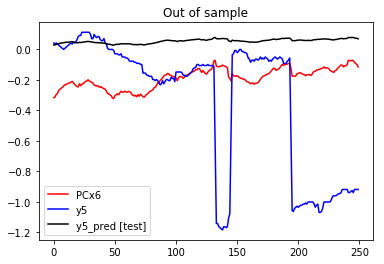

In [624]:
results = {}
results['Kalman Filter Optimized'] = {}
results['Kalman Filter Optimized']['Train'] = {}
results['Kalman Filter Optimized']['Test'] = {}

# loop over the y to be predicted
for y_i in df_y.columns:
    
    results['Kalman Filter Optimized']['Train'][y_i] = {} 
    results['Kalman Filter Optimized']['Test'][y_i] = {} 
    
    # loop over the singel PCs used as predictors in a linear regression model
    for PCx_j in df_PCx.columns:
        
        # retrieve test series for training and prediction
        x_train, x_test, y_train, y_test = setTrainAndTestSeries(x=df_PCx,y=df_y,
                                                                 col_x=PCx_j,col_y=y_i)
        
        # run the linear regression and retrieve predicted y (both in- and out- of sample)
        KFModelFitted, y_train_pred, y_test_pred, RMSE_train, RMSE_test, _, _ = runKalmanFilterModel(x_train, x_test, 
                                                                                                     y_train, y_test, 
                                                                                                     IO=True,
                                                                                                     optimized=True)
        
        # plot model predictions (in- and out- of sample, for comparison)
        plotModel(x_train, x_test, y_train, y_test, y_train_pred, y_test_pred)
        
        results['Kalman Filter Optimized']['Train'][y_i]['KF_Opt_'+PCx_j] = RMSE_train
        results['Kalman Filter Optimized']['Test'][y_i]['KF_Opt_'+PCx_j] = RMSE_test

trainResultKF_Opt_Model = pd.DataFrame(results['Kalman Filter Optimized']['Train'])
testResultKF_Opt_Model = pd.DataFrame(results['Kalman Filter Optimized']['Test'])
trainResultKF_Opt_Model.name = 'KF_Opt'
testResultKF_Opt_Model.name = 'KF_Opt'

In [625]:
trainResults = trainResults.append(trainResultKF_Opt_Model)
testResults = testResults.append(testResultKF_Opt_Model)

Best model in-sample by y:
y1    KF_Opt_PCx4
y2    KF_Opt_PCx4
y3    KF_Opt_PCx4
y4    KF_Opt_PCx4
y5    KF_Opt_PCx4
dtype: object


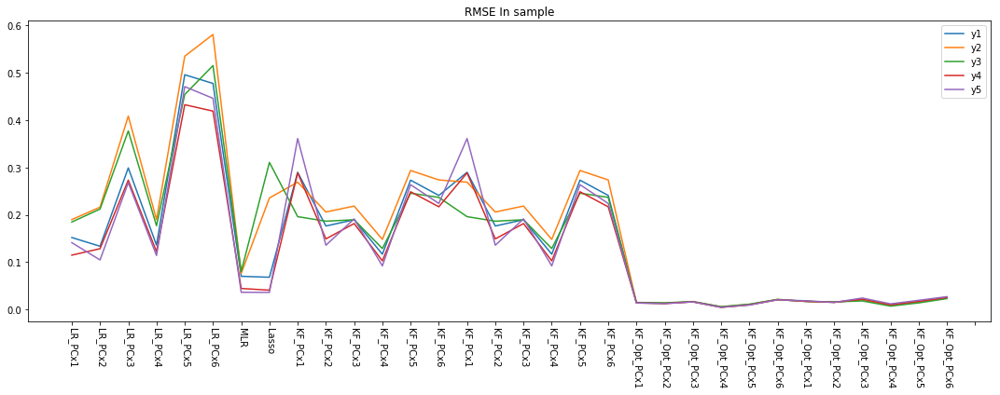

,y1,y2,y3,y4,y5
LR_PCx1,0.152051,0.189995,0.184832,0.114813,0.141190
LR_PCx2,0.133582,0.216253,0.212217,0.128466,0.104705
LR_PCx3,0.299190,0.408789,0.377306,0.273323,0.268133
LR_PCx4,0.136021,0.189945,0.177009,0.122126,0.114034
LR_PCx5,0.496102,0.535281,0.454352,0.432800,0.470991
LR_PCx6,0.477755,0.581159,0.515503,0.419247,0.446309
MLR,0.070084,0.076230,0.080298,0.044433,0.036322
Lasso,0.068102,0.235692,0.310884,0.040744,0.036117
KF_PCx1,0.289935,0.269008,0.196185,0.288686,0.361297
KF_PCx2,0.176399,0.205967,0.186587,0.149158,0.135770


In [626]:
print('Best model in-sample by y:')
print(trainResults.idxmin())

ax=trainResults.plot(figsize=(15,6))
ax.set_xticks(range(len(trainResults.index.values)+1))
ax.set_xticklabels(trainResults.index.values)
plt.title('RMSE In sample')
plt.xticks(rotation=-90)
plt.tight_layout()
plt.show()

trainResults

Best model out-of-sample by y:
y1    KF_PCx4
y2      Lasso
y3    LR_PCx1
y4      Lasso
y5        MLR
dtype: object


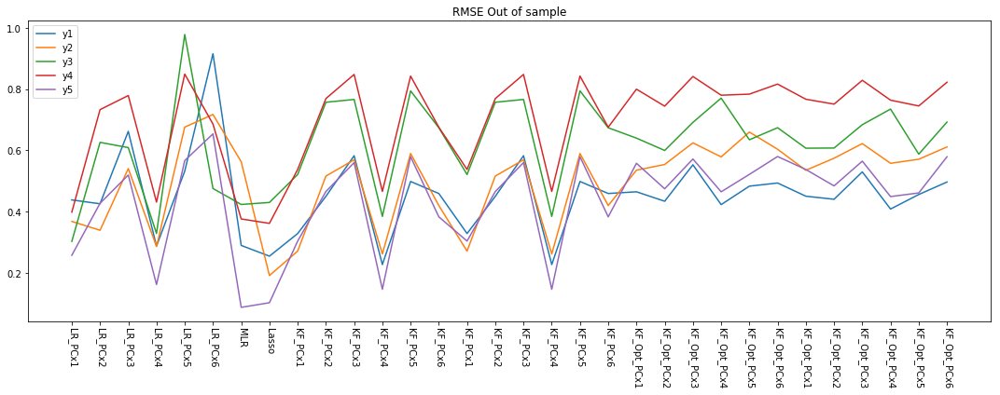

,y1,y2,y3,y4,y5
LR_PCx1,0.437942,0.367888,0.302783,0.398135,0.257347
LR_PCx2,0.425370,0.338904,0.625755,0.732607,0.426990
LR_PCx3,0.661684,0.540318,0.608685,0.778618,0.519273
LR_PCx4,0.287331,0.286109,0.328546,0.430902,0.161760
LR_PCx5,0.532020,0.675560,0.977715,0.848494,0.566461
LR_PCx6,0.915018,0.716783,0.475248,0.685394,0.653452
MLR,0.289490,0.562417,0.423087,0.375912,0.087440
Lasso,0.254450,0.191252,0.429687,0.361414,0.102481
KF_PCx1,0.328219,0.270949,0.520914,0.537374,0.303672
KF_PCx2,0.449613,0.515790,0.756666,0.768613,0.465263


In [627]:
print('Best model out-of-sample by y:')
print(testResults.idxmin())

ax = testResults.plot(figsize=(15,6))
ax.set_xticks(range(len(testResults.index.values)))
ax.set_xticklabels(testResults.index.values)
plt.title('RMSE Out of sample')
plt.xticks(rotation=-90)
plt.tight_layout()
plt.show()

testResults

### Model 4.3: Kalman filter with online prediction

uses x(t) to predict y(t)

RMSE in-sample = 0.29
RMSE out-of-sample = 0.26


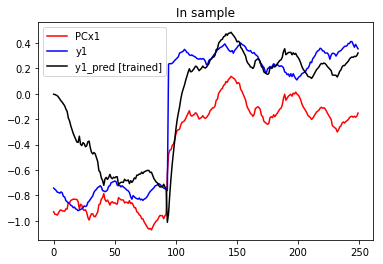

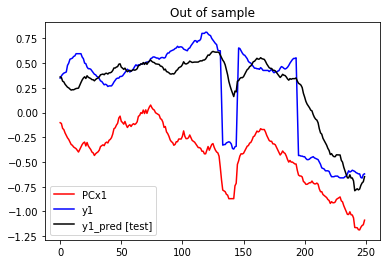

RMSE in-sample = 0.18
RMSE out-of-sample = 0.27


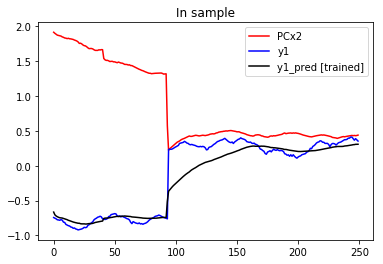

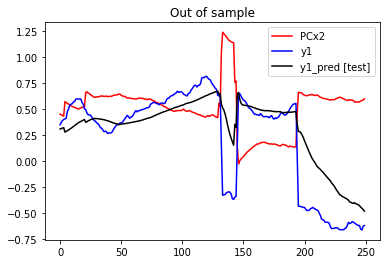

RMSE in-sample = 0.19
RMSE out-of-sample = 0.31


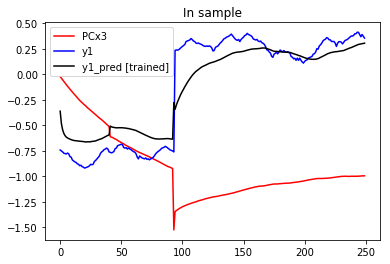

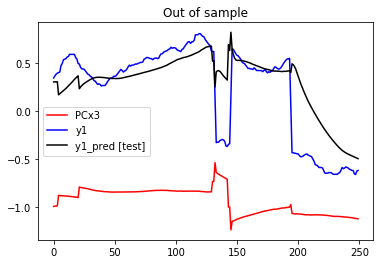

RMSE in-sample = 0.12
RMSE out-of-sample = 0.18


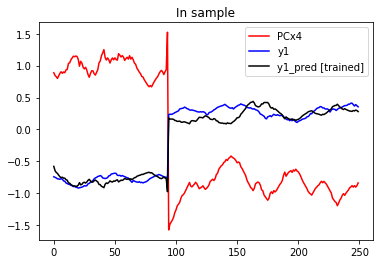

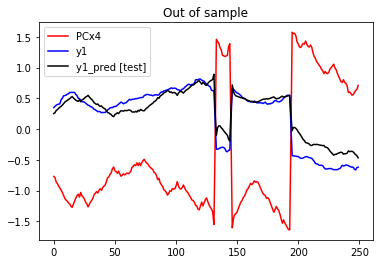

RMSE in-sample = 0.27
RMSE out-of-sample = 0.33


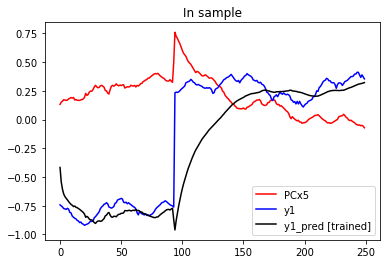

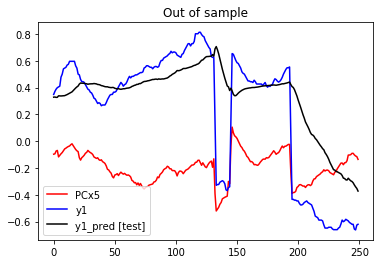

RMSE in-sample = 0.24
RMSE out-of-sample = 0.34


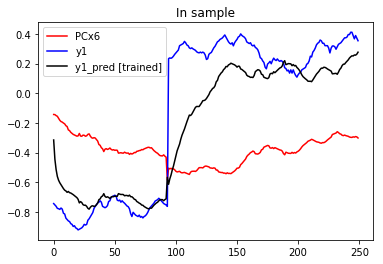

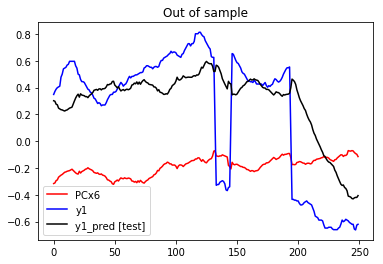

RMSE in-sample = 0.27
RMSE out-of-sample = 0.24


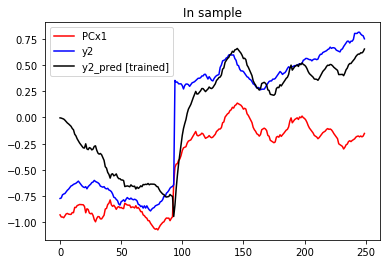

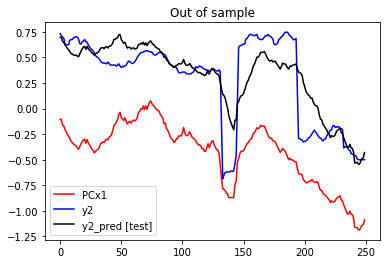

RMSE in-sample = 0.21
RMSE out-of-sample = 0.25


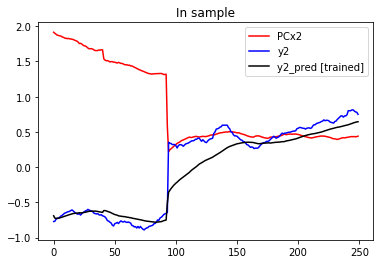

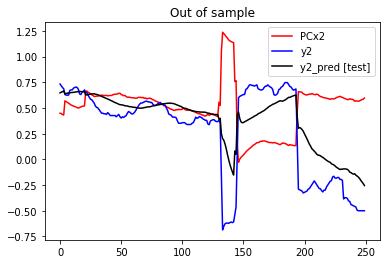

RMSE in-sample = 0.22
RMSE out-of-sample = 0.31


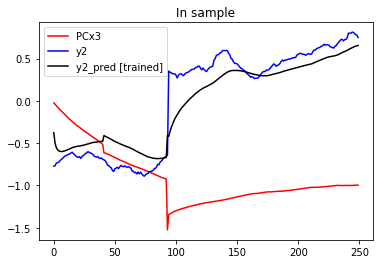

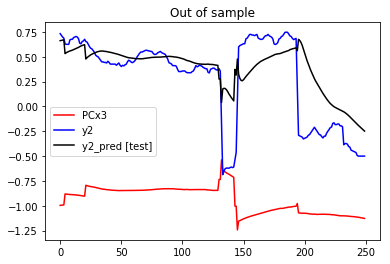

RMSE in-sample = 0.15
RMSE out-of-sample = 0.20


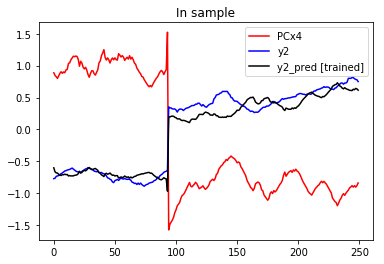

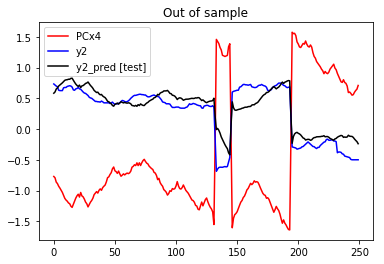

RMSE in-sample = 0.29
RMSE out-of-sample = 0.34


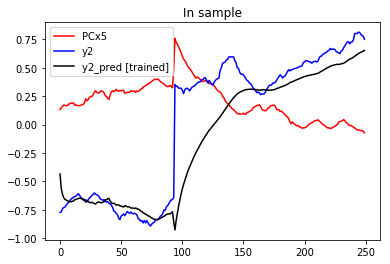

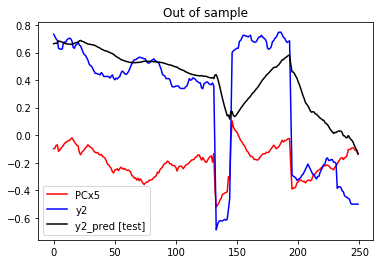

RMSE in-sample = 0.27
RMSE out-of-sample = 0.34


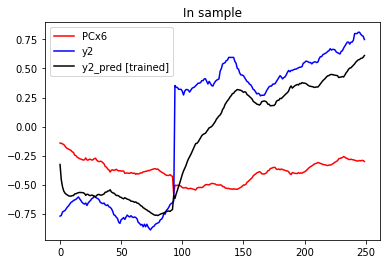

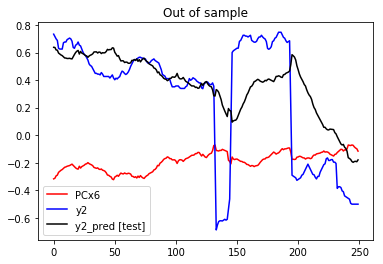

RMSE in-sample = 0.20
RMSE out-of-sample = 0.27


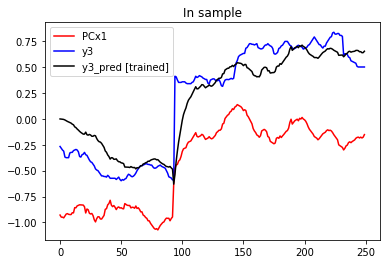

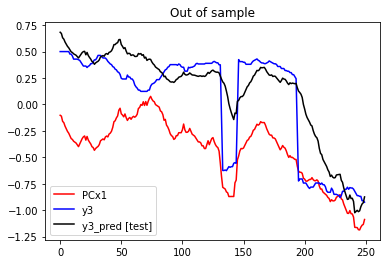

RMSE in-sample = 0.19
RMSE out-of-sample = 0.26


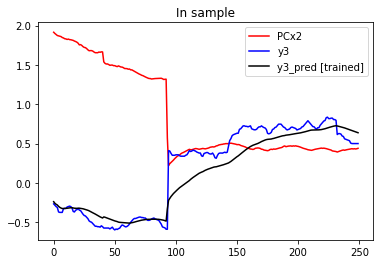

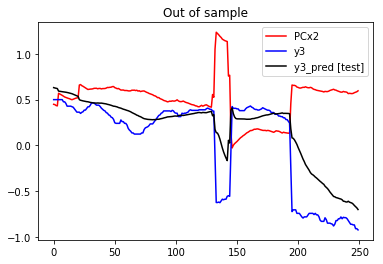

RMSE in-sample = 0.19
RMSE out-of-sample = 0.32


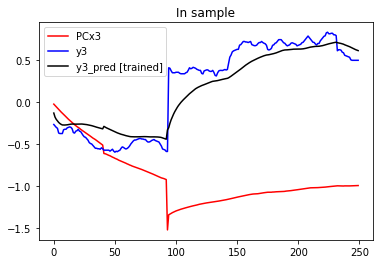

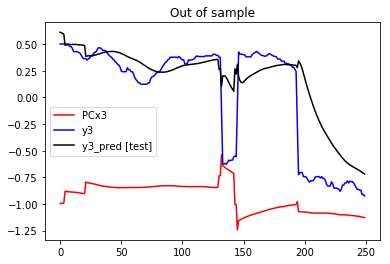

RMSE in-sample = 0.13
RMSE out-of-sample = 0.19


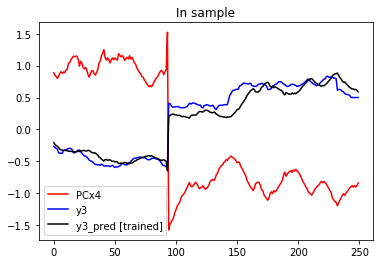

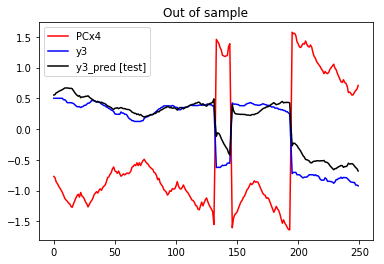

RMSE in-sample = 0.25
RMSE out-of-sample = 0.34


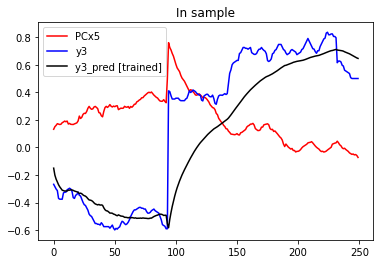

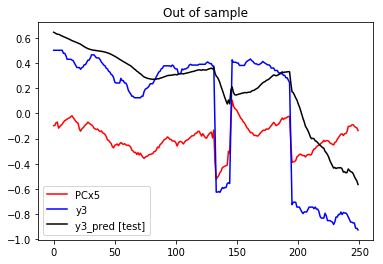

RMSE in-sample = 0.24
RMSE out-of-sample = 0.36


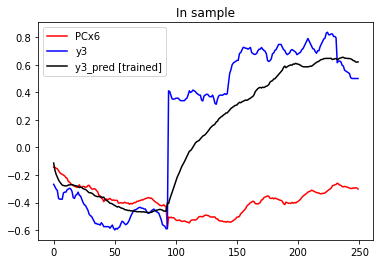

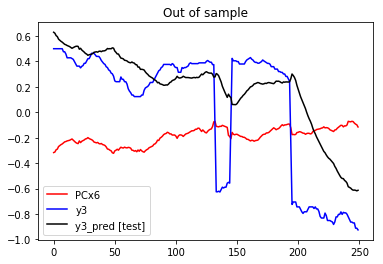

RMSE in-sample = 0.29
RMSE out-of-sample = 0.27


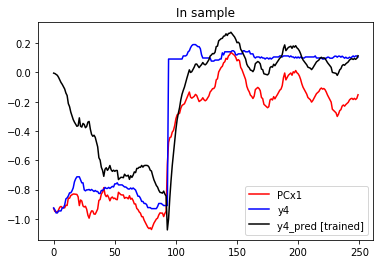

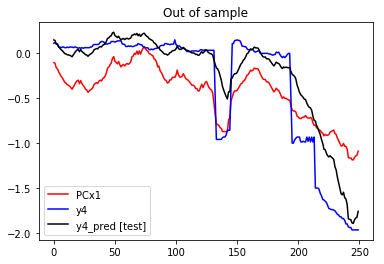

RMSE in-sample = 0.15
RMSE out-of-sample = 0.35


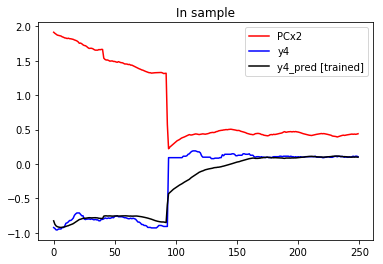

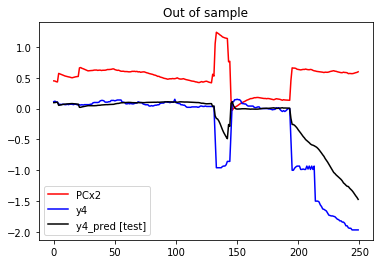

RMSE in-sample = 0.18
RMSE out-of-sample = 0.38


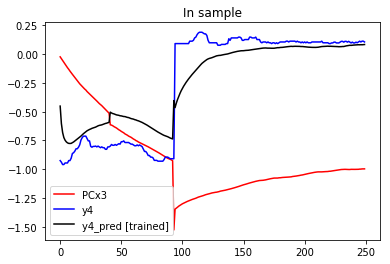

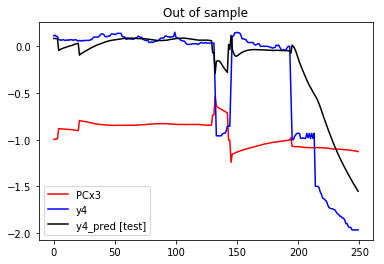

RMSE in-sample = 0.10
RMSE out-of-sample = 0.30


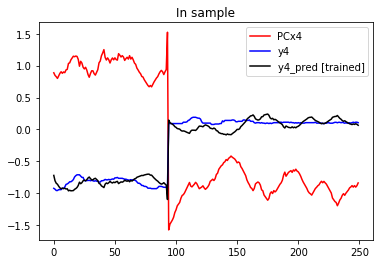

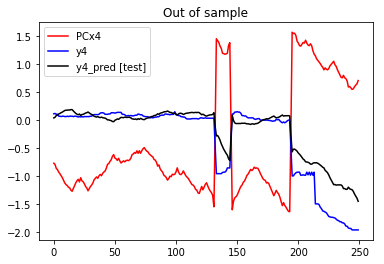

RMSE in-sample = 0.25
RMSE out-of-sample = 0.44


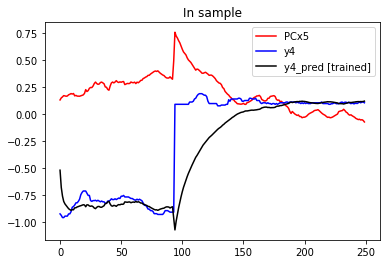

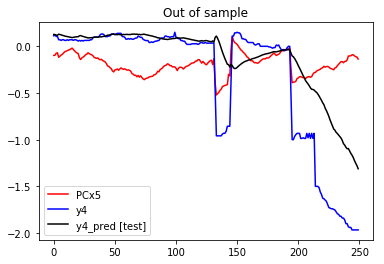

RMSE in-sample = 0.22
RMSE out-of-sample = 0.43


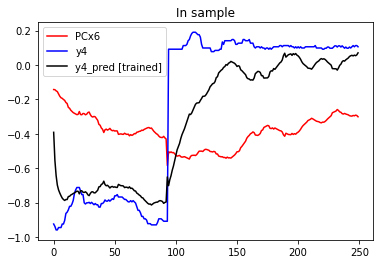

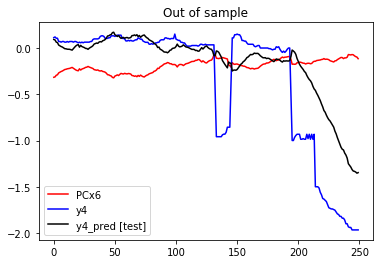

RMSE in-sample = 0.36
RMSE out-of-sample = 0.25


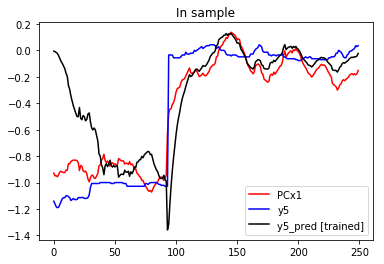

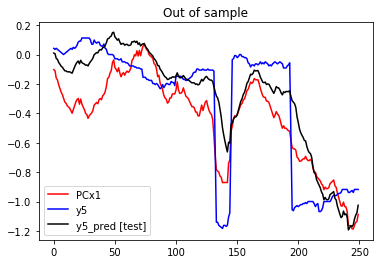

RMSE in-sample = 0.14
RMSE out-of-sample = 0.23


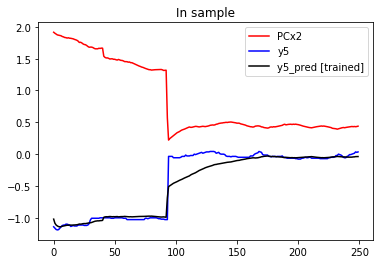

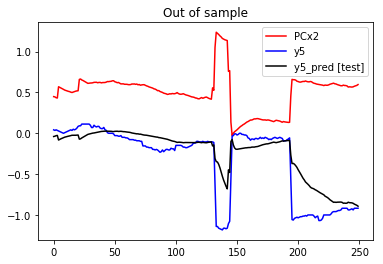

RMSE in-sample = 0.19
RMSE out-of-sample = 0.30


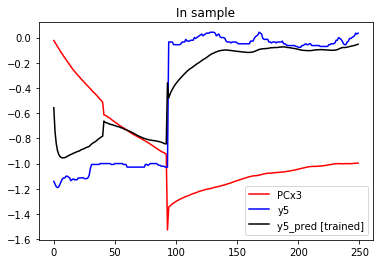

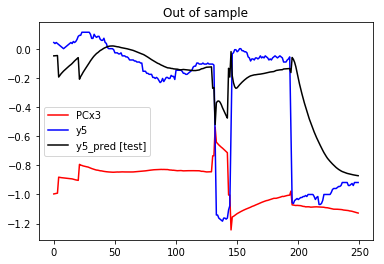

RMSE in-sample = 0.09
RMSE out-of-sample = 0.16


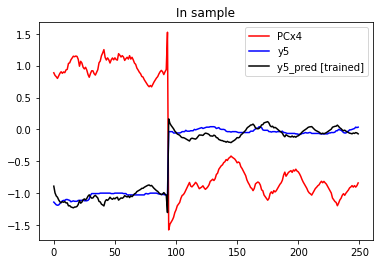

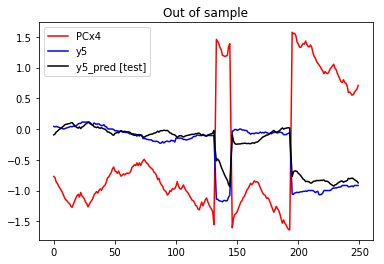

RMSE in-sample = 0.26
RMSE out-of-sample = 0.32


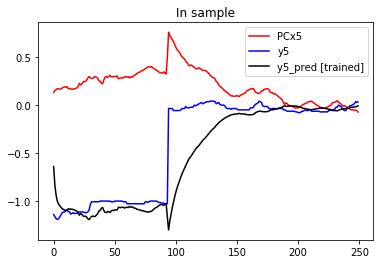

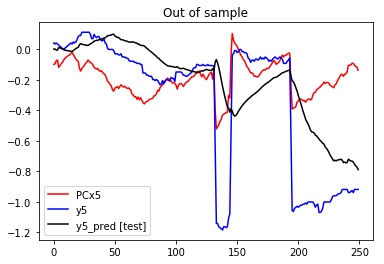

RMSE in-sample = 0.22
RMSE out-of-sample = 0.32


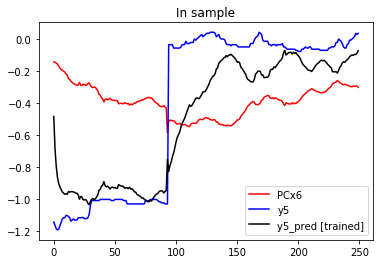

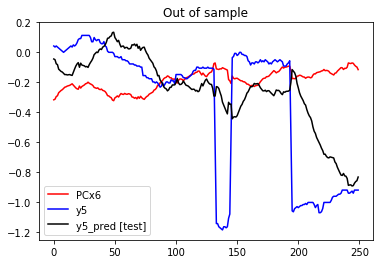

In [695]:
results = {}
results['Kalman Filter Online'] = {}
results['Kalman Filter Online']['Train'] = {}
results['Kalman Filter Online']['Test'] = {}

# loop over the y to be predicted
for y_i in df_y.columns:
    
    results['Kalman Filter Online']['Train'][y_i] = {} 
    results['Kalman Filter Online']['Test'][y_i] = {} 
    
    # loop over the singel PCs used as predictors in a linear regression model
    for PCx_j in df_PCx.columns:
        
        # retrieve test series for training and prediction
        x_train, x_test, y_train, y_test = setTrainAndTestSeries(x=df_PCx,y=df_y,
                                                                 col_x=PCx_j,col_y=y_i)
        
        # run the linear regression and retrieve predicted y (both in- and out- of sample)
        KFModelFitted, y_train_pred, y_test_pred, RMSE_train, RMSE_test, _, _ = runKalmanFilterModel(x_train, x_test, 
                                                                                                     y_train, y_test, 
                                                                                                     IO=True,
                                                                                                     online_prediction=True)
        
        # plot model predictions (in- and out- of sample, for comparison)
        plotModel(x_train, x_test, y_train, y_test, y_train_pred, y_test_pred)
        
        results['Kalman Filter Online']['Train'][y_i]['KF_Online_'+PCx_j] = RMSE_train
        results['Kalman Filter Online']['Test'][y_i]['KF_Online_'+PCx_j] = RMSE_test

trainResultKF_Online_Model = pd.DataFrame(results['Kalman Filter Online']['Train'])
testResultKF_Online_Model = pd.DataFrame(results['Kalman Filter Online']['Test'])
trainResultKF_Online_Model.name = 'KF_Online'
testResultKF_Online_Model.name = 'KF_Online'

In [684]:
trainResults = trainResults.append(trainResultKF_Online_Model)
testResults = testResults.append(testResultKF_Online_Model)

Best model in-sample by y:
y1    KF_Opt_PCx4
y2    KF_Opt_PCx4
y3    KF_Opt_PCx4
y4    KF_Opt_PCx4
y5    KF_Opt_PCx4
dtype: object


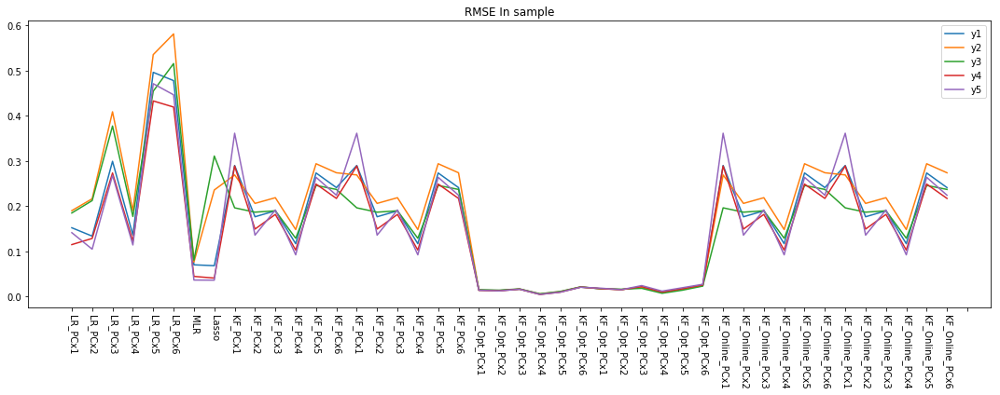

,y1,y2,y3,y4,y5
LR_PCx1,0.152051,0.189995,0.184832,0.114813,0.141190
LR_PCx2,0.133582,0.216253,0.212217,0.128466,0.104705
LR_PCx3,0.299190,0.408789,0.377306,0.273323,0.268133
LR_PCx4,0.136021,0.189945,0.177009,0.122126,0.114034
LR_PCx5,0.496102,0.535281,0.454352,0.432800,0.470991
LR_PCx6,0.477755,0.581159,0.515503,0.419247,0.446309
MLR,0.070084,0.076230,0.080298,0.044433,0.036322
Lasso,0.068102,0.235692,0.310884,0.040744,0.036117
KF_PCx1,0.289935,0.269008,0.196185,0.288686,0.361297
KF_PCx2,0.176399,0.205967,0.186587,0.149158,0.135770


In [685]:
print('Best model in-sample by y:')
print(trainResults.idxmin())

ax=trainResults.plot(figsize=(15,6))
ax.set_xticks(range(len(trainResults.index.values)+1))
ax.set_xticklabels(trainResults.index.values)
plt.title('RMSE In sample')
plt.xticks(rotation=-90)
plt.tight_layout()
plt.show()

trainResults

Best model out-of-sample by y:
y1           KF_PCx4
y2             Lasso
y3    KF_Online_PCx4
y4             Lasso
y5               MLR
dtype: object


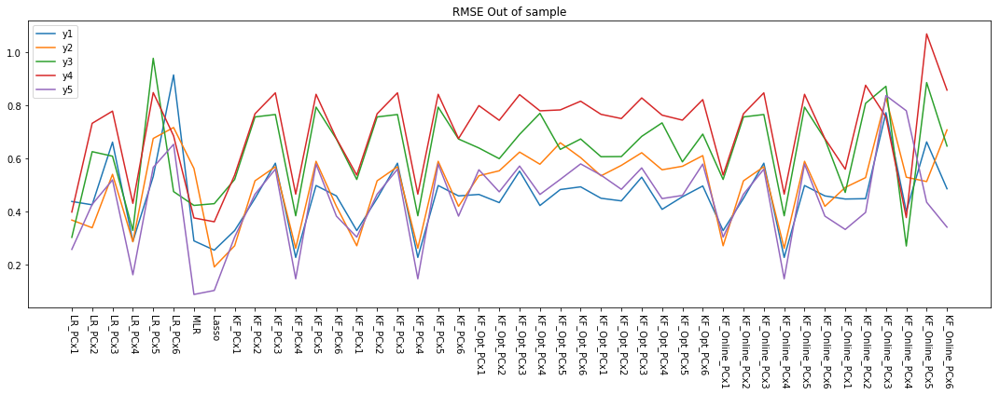

,y1,y2,y3,y4,y5
LR_PCx1,0.437942,0.367888,0.302783,0.398135,0.257347
LR_PCx2,0.425370,0.338904,0.625755,0.732607,0.426990
LR_PCx3,0.661684,0.540318,0.608685,0.778618,0.519273
LR_PCx4,0.287331,0.286109,0.328546,0.430902,0.161760
LR_PCx5,0.532020,0.675560,0.977715,0.848494,0.566461
LR_PCx6,0.915018,0.716783,0.475248,0.685394,0.653452
MLR,0.289490,0.562417,0.423087,0.375912,0.087440
Lasso,0.254450,0.191252,0.429687,0.361414,0.102481
KF_PCx1,0.328219,0.270949,0.520914,0.537374,0.303672
KF_PCx2,0.449613,0.515790,0.756666,0.768613,0.465263


In [686]:
print('Best model out-of-sample by y:')
print(testResults.idxmin())

ax = testResults.plot(figsize=(15,6))
ax.set_xticks(range(len(testResults.index.values)))
ax.set_xticklabels(testResults.index.values)
plt.title('RMSE Out of sample')
plt.xticks(rotation=-90)
plt.tight_layout()
plt.show()

testResults

In [687]:
y_test[10]

0.014084506779909134

In [690]:
y_test[10-5:11].mean()

0.01056338008493185

In [693]:
y_train.tail(5).values.mean()

0.02394366227090359